# 필요한 패키지 임포트

In [161]:
%matplotlib inline
import numpy as np
import seaborn as sns
import pandas_profiling
import matplotlib.pyplot as plt
from xgboost import XGBClassifier
from sklearn.cluster import KMeans
from workalendar.asia import SouthKorea
from matplotlib.ticker import FuncFormatter
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, classification_report

# 데이터 로드

In [1]:
df = pd.read_csv('C:/Users/ppq39/Desktop/big_contest/data/2023_a_league.csv')

# EDA 프로파일링

In [2]:
#!pip install pandas_profiling

In [3]:
#pr=df.profile_report() # 프로파일링 결과 리포트를 pr에 저장

C:\Users\ppq39\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  """Entry point for launching an IPython kernel.


In [4]:
#pr

# 전처리 (Preprocessing)

In [5]:
pc_df = df.copy()
#전처리된 데이터와 되기 전 데이터 구분

### genre

In [6]:
unique_values_genre = df['genre'].unique()
print(unique_values_genre)

['교향곡' '독주' '실내악' '클래식' '오페라' '합창' '성악' '콘서트' nan '복합장르' '기타' '전시' '재즈'
 '크로스오버' '가족극' '무용']


In [7]:
#genre의 결측치가 있는 행 추출
rows_with_null_genre= df[df['genre'].isnull()]

In [8]:
#genre의 결측치가 있는 행의 고유한 공연코드
unique_values_rows_with_null_genre = rows_with_null_genre['performance_code'].unique()
unique_values_rows_with_null_genre.sort()
print(unique_values_rows_with_null_genre)

[  47  229  352  354  588  852  988 1221 1405 1751 2215 2472 2816 2818
 2819 2937]


In [9]:
# 공연코드 47번의 genre 결측치 확인
rows_performance_47 = df[df['performance_code'] == 47]
unique_47_genre_values = rows_performance_47['genre'].unique()
print(unique_47_genre_values)

[nan]


In [10]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 47이고 'genre' 열의 결측치인 행의 'genre' 값을 '클래식'으로 변경
pc_df.loc[(pc_df['performance_code'] == 47) & (pc_df['genre'].isnull()), 'genre'] = '클래식'

In [11]:
filtered_rows47 = pc_df[pc_df['performance_code'] == 47]
filtered_rows47_unique = filtered_rows47['genre'].unique()
print(filtered_rows47_unique)
# 결측치 확인

['클래식']


In [12]:
# 공연코드 229번의 genre 결측치 확인
rows_performance_229 = df[df['performance_code'] == 229]
unique_229_genre_values = rows_performance_229['genre'].unique()
print(unique_229_genre_values)

[nan '교향곡']


In [13]:
# 'performance_code' 열의 값이 229이고 'genre' 열의 결측치인 행의 'genre' 값을 '교향곡'으로 변경
# 장르 결측치가 있지만, 일부 채워진 데이터를 이용하여 하나로 통일
pc_df.loc[(pc_df['performance_code'] == 229) & (pc_df['genre'].isnull()), 'genre'] = '교향곡'

In [14]:
filtered_rows229 = pc_df[pc_df['performance_code'] == 229]
filtered_rows229_unique = filtered_rows229['genre'].unique()
print(filtered_rows229_unique)
# 결측치 확인

['교향곡']


In [15]:
# 공연코드 352번의 genre 결측치 확인
rows_performance_352 = df[df['performance_code'] == 352]
unique_352_genre_values = rows_performance_352['genre'].unique()
print(unique_352_genre_values)

[nan]


In [16]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 352이고 'genre' 열의 결측치인 행의 'genre' 값을 '클래식'으로 변경
pc_df.loc[(pc_df['performance_code'] == 352) & (pc_df['genre'].isnull()), 'genre'] = '클래식'

In [17]:
filtered_rows352 = pc_df[pc_df['performance_code'] == 352]
filtered_rows352_unique = filtered_rows352['genre'].unique()
print(filtered_rows352_unique)
# 결측치 확인

['클래식']


In [18]:
# 공연코드 354번의 genre 결측치 확인
rows_performance_354 = df[df['performance_code'] == 354]
unique_354_genre_values = rows_performance_354['genre'].unique()
print(unique_354_genre_values)

[nan]


In [19]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 354이고 'genre' 열의 결측치인 행의 'genre' 값을 '교향곡'으로 변경
pc_df.loc[(pc_df['performance_code'] == 354) & (pc_df['genre'].isnull()), 'genre'] = '교향곡'

In [20]:
filtered_rows354 = pc_df[pc_df['performance_code'] == 354]
filtered_rows354_unique = filtered_rows354['genre'].unique()
print(filtered_rows354_unique)
# 결측치 확인

['교향곡']


In [21]:
# 공연코드 588번의 genre 결측치 확인
rows_performance_588 = df[df['performance_code'] == 588]
unique_588_genre_values = rows_performance_588['genre'].unique()
print(unique_588_genre_values)

[nan]


In [22]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 588이고 'genre' 열의 결측치인 행의 'genre' 값을 '교향곡'으로 변경
pc_df.loc[(pc_df['performance_code'] == 588) & (pc_df['genre'].isnull()), 'genre'] = '교향곡'

In [23]:
filtered_rows588 = pc_df[pc_df['performance_code'] == 588]
filtered_rows588_unique = filtered_rows588['genre'].unique()
print(filtered_rows588_unique)
# 결측치 확인

['교향곡']


In [24]:
# 공연코드 852번의 genre 결측치 확인
rows_performance_852 = df[df['performance_code'] == 852]
unique_852_genre_values = rows_performance_852['genre'].unique()
print(unique_852_genre_values)

[nan]


In [25]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 852이고 'genre' 열의 결측치인 행의 'genre' 값을 '클래식'으로 변경
pc_df.loc[(pc_df['performance_code'] == 852) & (pc_df['genre'].isnull()), 'genre'] = '클래식'

In [26]:
filtered_rows852 = pc_df[pc_df['performance_code'] == 852]
filtered_rows852_unique = filtered_rows852['genre'].unique()
print(filtered_rows852_unique)
# 결측치 확인

['클래식']


In [27]:
# 공연코드 988번의 genre 결측치 확인
rows_performance_988 = df[df['performance_code'] == 988]
unique_988_genre_values = rows_performance_988['genre'].unique()
print(unique_988_genre_values)

[nan]


In [28]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 988이고 'genre' 열의 결측치인 행의 'genre' 값을 '교향곡'으로 변경
pc_df.loc[(pc_df['performance_code'] == 988) & (pc_df['genre'].isnull()), 'genre'] = '교향곡'

In [29]:
filtered_rows988 = pc_df[pc_df['performance_code'] == 988]
filtered_rows988_unique = filtered_rows988['genre'].unique()
print(filtered_rows988_unique)
# 결측치 확인

['교향곡']


In [30]:
# 공연코드 1221번의 genre 결측치 확인
rows_performance_1221 = df[df['performance_code'] == 1221]
unique_1221_genre_values = rows_performance_1221['genre'].unique()
print(unique_1221_genre_values)

[nan]


In [31]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 1221이고 'genre' 열의 결측치인 행의 'genre' 값을 '클래식'으로 변경
pc_df.loc[(pc_df['performance_code'] == 1221) & (pc_df['genre'].isnull()), 'genre'] = '클래식'

In [32]:
filtered_rows1221 = pc_df[pc_df['performance_code'] == 1221]
filtered_rows1221_unique = filtered_rows1221['genre'].unique()
print(filtered_rows1221_unique)
# 결측치 확인

['클래식']


In [33]:
# 공연코드 1405번의 genre 결측치 확인
rows_performance_1405 = df[df['performance_code'] == 1405]
unique_1405_genre_values = rows_performance_1405['genre'].unique()
print(unique_1405_genre_values)

[nan]


In [34]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 1405이고 'genre' 열의 결측치인 행의 'genre' 값을 '실내악'으로 변경
pc_df.loc[(pc_df['performance_code'] == 1405) & (pc_df['genre'].isnull()), 'genre'] = '실내악'

In [35]:
filtered_rows1405 = pc_df[pc_df['performance_code'] == 1405]
filtered_rows1405_unique = filtered_rows1405['genre'].unique()
print(filtered_rows1405_unique)
# 결측치 확인

['실내악']


In [36]:
# 공연코드 1751번의 genre 결측치 확인
rows_performance_1751 = df[df['performance_code'] == 1751]
unique_1751_genre_values = rows_performance_1751['genre'].unique()
print(unique_1751_genre_values)

[nan]


In [37]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 1751이고 'genre' 열의 결측치인 행의 'genre' 값을 '클래식'으로 변경
pc_df.loc[(pc_df['performance_code'] == 1751) & (pc_df['genre'].isnull()), 'genre'] = '클래식'

In [38]:
filtered_rows1751 = pc_df[pc_df['performance_code'] == 1751]
filtered_rows1751_unique = filtered_rows1751['genre'].unique()
print(filtered_rows1751_unique)
# 결측치 확인

['클래식']


In [39]:
# 공연코드 2215번의 genre 결측치 확인
rows_performance_2215 = df[df['performance_code'] == 2215]
unique_2215_genre_values = rows_performance_2215['genre'].unique()
print(unique_2215_genre_values)

['클래식' nan]


In [40]:
# 'performance_code' 열의 값이 2215이고 'genre' 열의 결측치인 행의 'genre' 값을 '클래식'으로 변경
# 장르 결측치가 있지만, 일부 채워진 데이터를 이용하여 하나로 통일
pc_df.loc[(pc_df['performance_code'] == 2215) & (pc_df['genre'].isnull()), 'genre'] = '클래식'

In [41]:
filtered_rows2215 = pc_df[pc_df['performance_code'] == 2215]
filtered_rows2215_unique = filtered_rows2215['genre'].unique()
print(filtered_rows2215_unique)
# 결측치 확인

['클래식']


In [42]:
# 공연코드 2472번의 genre 결측치 확인
rows_performance_2472 = df[df['performance_code'] == 2472]
unique_2472_genre_values = rows_performance_2472['genre'].unique()
print(unique_2472_genre_values)

[nan]


In [43]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 2472이고 'genre' 열의 결측치인 행의 'genre' 값을 '교향곡'으로 변경
pc_df.loc[(pc_df['performance_code'] == 2472) & (pc_df['genre'].isnull()), 'genre'] = '교향곡'

In [44]:
filtered_rows2472 = pc_df[pc_df['performance_code'] == 2472]
filtered_rows2472_unique = filtered_rows2472['genre'].unique()
print(filtered_rows2472_unique)
# 결측치 확인

['교향곡']


In [45]:
# 공연코드 2816번의 genre 결측치 확인
rows_performance_2816 = df[df['performance_code'] == 2816]
unique_2816_genre_values = rows_performance_2816['genre'].unique()
print(unique_2816_genre_values)

[nan]


In [46]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 2816이고 'genre' 열의 결측치인 행의 'genre' 값을 '클래식'으로 변경
pc_df.loc[(pc_df['performance_code'] == 2816) & (pc_df['genre'].isnull()), 'genre'] = '클래식'

In [47]:
filtered_rows2816 = pc_df[pc_df['performance_code'] == 2816]
filtered_rows2816_unique = filtered_rows2816['genre'].unique()
print(filtered_rows2816_unique)
# 결측치 확인

['클래식']


In [48]:
# 공연코드 2818번의 genre 결측치 확인
rows_performance_2818 = df[df['performance_code'] == 2818]
unique_2818_genre_values = rows_performance_2818['genre'].unique()
print(unique_2818_genre_values)

[nan]


In [49]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 2818이고 'genre' 열의 결측치인 행의 'genre' 값을 '클래식'으로 변경
pc_df.loc[(pc_df['performance_code'] == 2818) & (pc_df['genre'].isnull()), 'genre'] = '클래식'

In [50]:
filtered_rows2818 = pc_df[pc_df['performance_code'] == 2818]
filtered_rows2818_unique = filtered_rows2818['genre'].unique()
print(filtered_rows2818_unique)
# 결측치 확인

['클래식']


In [51]:
# 공연코드 2819번의 genre 결측치 확인
rows_performance_2819 = df[df['performance_code'] == 2819]
unique_2819_genre_values = rows_performance_2818['genre'].unique()
print(unique_2819_genre_values)

[nan]


In [52]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 2819이고 'genre' 열의 결측치인 행의 'genre' 값을 '클래식'으로 변경
pc_df.loc[(pc_df['performance_code'] == 2819) & (pc_df['genre'].isnull()), 'genre'] = '클래식'

In [53]:
filtered_rows2819 = pc_df[pc_df['performance_code'] == 2819]
filtered_rows2819_unique = filtered_rows2819['genre'].unique()
print(filtered_rows2819_unique)
# 결측치 확인

['클래식']


In [54]:
# 공연코드 2937번의 genre 결측치 확인
rows_performance_2937 = df[df['performance_code'] == 2937]
unique_2937_genre_values = rows_performance_2937['genre'].unique()
print(unique_2937_genre_values)

[nan]


In [55]:
# 예술의 전당 홈페이지 방문후, 조건에 맞는 공연 검색후, 직접 수정.
# 'performance_code' 열의 값이 2937이고 'genre' 열의 결측치인 행의 'genre' 값을 '클래식'으로 변경
pc_df.loc[(pc_df['performance_code'] == 2937) & (pc_df['genre'].isnull()), 'genre'] = '클래식'

In [56]:
filtered_rows2937 = pc_df[pc_df['performance_code'] == 2937]
filtered_rows2937_unique = filtered_rows2937['genre'].unique()
print(filtered_rows2937_unique)
# 결측치 확인

['클래식']


In [57]:
# LabelEncoder 객체 생성
le = LabelEncoder()

# 'genre' 열의 값들을 라벨 인코딩
pc_df['genre'] = le.fit_transform(pc_df['genre'])

# 각 숫자가 어떤 'genre' 값을 의미하는지 출력
for class_name, class_label in zip(le.classes_, range(len(le.classes_))):
    print(f"'{class_name}' is encoded as {class_label}")


'가족극' is encoded as 0
'교향곡' is encoded as 1
'기타' is encoded as 2
'독주' is encoded as 3
'무용' is encoded as 4
'복합장르' is encoded as 5
'성악' is encoded as 6
'실내악' is encoded as 7
'오페라' is encoded as 8
'재즈' is encoded as 9
'전시' is encoded as 10
'콘서트' is encoded as 11
'크로스오버' is encoded as 12
'클래식' is encoded as 13
'합창' is encoded as 14


In [58]:
pc_df['genre']

0          1
1          3
2          3
3          3
4          3
          ..
1920863    7
1920864    1
1920865    3
1920866    3
1920867    7
Name: genre, Length: 1920868, dtype: int32

### date_difference

In [59]:
#open_date 컬럼의 null 값을 play_date 값으로 채우기
pc_df.loc[pc_df['open_date'].isnull(), 'open_date'] = pc_df.loc[pc_df['open_date'].isnull(), 'play_date']

In [60]:
# int 형식을 날짜로 변환
pc_df['play_date'] = pd.to_datetime(pc_df['play_date'], format='%Y%m%d')
pc_df['open_date'] = pd.to_datetime(pc_df['open_date'], format='%Y%m%d')

In [61]:
# 날짜 차이 계산
pc_df['date_difference'] = (pc_df['play_date'] - pc_df['open_date']).dt.days

### is_holiday

In [62]:
#!pip install workalendar

In [63]:
# 대한민국 공휴일을 감지하기 위한 SouthKorea 객체 생성
cal = SouthKorea()

# 'play_date' 열을 기반으로 공휴일 여부를 판별하고 1 또는 0으로 표시
pc_df['is_holiday'] = pc_df['play_date'].apply(lambda x: 1 if cal.is_holiday(x) else 0)

### day_type

In [64]:
# 요일에 대한 토큰화 함수 정의
def tokenize_weekday(date):
    weekday_number = date.weekday() + 1  # 요일 번호는 0부터 시작하므로 +1 처리
    return weekday_number

# 'play_date' 컬럼을 기반으로 요일 토큰 생성
pc_df['day_type'] = pc_df['play_date'].apply(tokenize_weekday)

### time category

In [65]:
# 'play_time'을 분류하여 'time_category' 열 생성
def classify_time(time):
    if 1000 <= time <= 1200:
        return 1  # 오전
    elif 1200 < time < 1800:
        return 2  # 오후
    elif 1800 <= time <= 2000:
        return 3  # 저녁
    else:
        return None  # 다른 범위에 해당하지 않는 경우

pc_df['time_category'] = pc_df['play_st_time'].apply(classify_time)

### place

In [66]:
# 'place' 열을 토큰화.
pc_df['place'] = pc_df['place'].apply(lambda x: 1 if '콘서트홀' in x else (2 if 'IBK챔버홀' in x else (3 if '리사이틀홀' in x else None)))

### reservation_rate

In [67]:
# 'place' 열에 따라 좌석의 총 수인'seat_sum' 열 생성
pc_df['seat_sum'] = pc_df['place'].apply(lambda x: 2505 if x == 1 else (600 if x == 2 else (354 if x == 3 else None)))

In [68]:
# seat 열의 띄어쓰기 제거
pc_df['seat'] = pc_df['seat'].str.replace(' ', '')

In [69]:
# 각 performance_code 별로 play_date와 play_st_time이 같은 행들을 찾아서 카운트하여 reservation_sum 컬럼 생성
pc_df['reservation_sum'] = pc_df.groupby(['performance_code', 'play_date', 'play_st_time'])['performance_code'].transform('count')

In [70]:
# ticket_cancel 컬럼 값 변경
# 기존 데이터 값은 2이면 취소, 0이면 유지.
# 바뀐 데이터는 1이면 유지, 0이면 취소로 변경. (1이면 True, 0이면 False인 관례를 적용.)
pc_df['ticket_cancel'] = pc_df['ticket_cancel'].map({2: 0, 0: 1})

In [71]:
# 티켓 가격이 0인 행들을 모두 취소값으로 간주
pc_df.loc[pc_df['price'] == 0, 'ticket_cancel'] = 0

In [72]:
# 공연별 티켓 취소의 합
def count_cancel_0(group):
    return (group == 0).sum()

pc_df['ticket_cancel_sum'] = pc_df.groupby(['performance_code', 'play_date', 'play_st_time'])['ticket_cancel'].transform(count_cancel_0)

In [73]:
# 예약좌석 총 수 - 티켓 취소의 합 = final_reservation_sum
pc_df['final_reservation_sum'] = pc_df['reservation_sum'] - pc_df['ticket_cancel_sum']

In [74]:
# 'reservation_rate' 컬럼 생성 (final_sum / seat_sum)
pc_df['reservation_rate'] = (pc_df['final_reservation_sum'] / pc_df['seat_sum']) * 100

# 100%를 넘는 행들 중에서 고유한 'performance_code'를 오름차순으로 출력
unique_performance_codes = pc_df[pc_df['reservation_rate'] > 100]['performance_code'].unique()
unique_performance_codes.sort()
print(unique_performance_codes)

[]


In [75]:
# reservation_rate 값이 0 미만인 행 필터링
filtered_df = pc_df[pc_df['reservation_rate'] < 0]

# performance_code 컬럼의 고유한 값들을 오름차순으로 출력
unique_codes = filtered_df['performance_code'].unique()
sorted_codes = sorted(unique_codes)

print(sorted_codes)


[]


### corona_reg

In [76]:
# 토큰 정의
# 1단계 = 1, 1.5단계 = 2, 2단계 = 3, 2.5단계 = 4, 3단계 = 5, 4단계 = 6, 단계 미적용 = 0
# 함수적용을 위해, datetime이 아닌 기존 정수형 데이터를 사용
tokens = {
    (20200229, 20200505): 5,
    (20200506, 20200815): 1,
    (20200816, 20200829): 3,
    (20200830, 20200913): 4,
    (20200914, 20201011): 3,
    (20201012, 20201118): 1,
    (20201119, 20201123): 2,
    (20201124, 20201207): 3,
    (20201208, 20210214): 4,
    (20210215, 20210711): 3,
    (20210712, 20211031): 6,
    (20211101, 20220417): 1,
}

# 'play_date' 컬럼을 토큰화하여 새로운 컬럼 'corona_reg'에 추가
def get_token(date):
    for date_range, token in tokens.items():
        date_start, date_end = date_range
        if date_start <= date <= date_end:
            return token
    return 0

pc_df['corona_reg'] = df['play_date'].apply(get_token)

In [78]:
corona = pd.read_csv('C:/Users/ppq39/Desktop/big_contest/data/서울시 코로나19 확진자 발생동향.csv',encoding='cp949')

In [79]:
corona.head()

,서울시 기준일,서울시 확진자,서울시 추가 확진,서울시 치료중,서울시 퇴원,서울시 추가 퇴원,서울시 사망,서울시 의심환자 전체,서울시 의심환자 검사중,서울시 의심환자 검사결과(음성),...,전국 의심환자 전체,전국 의심환자 검사중,전국 의심환자 검사결과(음성),자가격리자 해외입국자 감시중,자가격리자 해외입국자 감시해제,자가격리자 접촉자 감시중,자가격리자 접촉자 감시해제,확인중 확진자,서울시 당일사망자,전국 당일 사망자
0,2023.05.31.00,6204277,5987,0,NaN,NaN,6492,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,6.0,17.0
1,2023.05.30.00,6198290,3326,0,NaN,NaN,6486,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,7.0
2,2023.05.29.00,6194964,1393,0,NaN,NaN,6485,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,3.0
3,2023.05.28.00,6194964,1393,0,NaN,NaN,6485,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,3.0
4,2023.05.27.00,6191196,4078,0,NaN,NaN,6485,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,3.0


In [80]:
# 기존 데이터 프레임에 적용하기 위해 데이터 정규화
# 타입을 정수로 변경
corona.loc[:, '서울시 기준일'] = corona['서울시 기준일'].astype(str).str.replace('.', '', regex=True).str.slice(0, 8).astype(int)

In [81]:
# 코로나 추가확진자 컬럼을 만들기 위한 임시 df 생성
pc2_df = df

# 'corona_infected' 컬럼을 0으로 초기화
pc2_df['corona_infected'] = 0

# pc2_df와 corona를 '서울시 기준일'을 기준으로 조인
corona_temp_merged_df = pc2_df.merge(corona, left_on='play_date', right_on='서울시 기준일', how='left')

# '서울시 추가 확진' 열의 결측치를 0으로 채움
corona_temp_merged_df['서울시 추가 확진'].fillna(0, inplace=True)

# 'corona_infected' 컬럼에 값을 할당
pc_df['corona_infected'] = corona_temp_merged_df['서울시 추가 확진']

### 좌석등급

In [82]:
### 좌석 알아내기
seat = df[['seat','place']]

# place별로 분류
unique_place = seat['place'].unique()

In [83]:
## 좌석등급 유추 2번째 방법
g_data = df[['performance_code','price','discount_type']]

unique_discount= g_data['discount_type'].unique()
print(unique_discount)

## 퍼센트 유무 열 만들기
g_data['per'] = 0

 # 퍼센트 포함된 값 분류
gg_data=g_data.copy()
g_data[g_data['discount_type'].str.contains('%')]
gg_data['per'] = np.where(g_data['discount_type'].str.contains('%'), 1, 0)

## 퍼센트 숫자만 뽑기
gg_data['perc1'] = 0
gg_data['perc1'] = gg_data['discount_type'].str.extract(r'(\d+%)')

gg_data['perc']=0
gg_data['perc'] = gg_data['perc1'].str.extract(r'(\d+)')

gg_data = gg_data.drop(columns=['perc1'])
#gg_data

['일반' '초대권' '블루회원 할인20%' '골드회원 할인20%' '기획사' 'K-lang 멤버십 회원(1인2매)20%'
 '기획사판매' '골드회원 할인30%' 'R석 기획사 할인' '싹틔우미 할인40%'
 '라흐마니노프탄생150주년(8매/3.27까지)20%' '공연진행석' '골드회원 할인10%' '장애인/국가유공자 할인50%'
 '싹딜가(골드)50%' '당일할인티켓' '그린회원 할인5%' '초,중,고,대학생(본인만)30%' '조기예매 할인40%'
 '그린회원 할인20%' '한화초대석' '단체100인이상50%' '공연예매권' '초/중/고등학생 할인(본인만)30%'
 '골드회원 할인15%' '골드회원 할인25%' '우리카드 우수회원' '조기예매 할인(1인8매/3월11일까지)30%' '신세계석'
 '골드회원 할인5%' '정기회원' '만65세 이상(본인만)50%' '싹딜가(블루)50%' '그린회원 할인15%'
 '직장인 할인(1인2매)20%' '블루회원 할인10%' '기획사판매20%' '초/중/고/대학생 할인(본인만)50%'
 '문화릴레이(1인2매/공연유료티켓제시)10%' '조기예매 할인10%' '노블회원 할인40%' 'K-Lang 할인(1인2매)20%'
 '골드회원 할인40%' '초/중/고등학생 할인(본인만)20%' '조기예매 할인(1인2매/~10월31일까지)30%' '기업석'
 '초/중/고/대학생 할인30%' '초/중/고/대학생 할인50%' '의사상자(동반1인/신분증지참)50%'
 '초,중,고,대학생(본인만)50%' '조기예매할인(1인8매/~6.30까지)30%' '그린회원 할인10%' '블루회원 할인5%'
 '연주자 할인50%' '스탭 할인30%' '홍보진행' 'KOSYMI  유료회원(1인4매)40%'
 '청소년(만7세~만24세/본인만)50%' '청소년(만 24세 이하/본인만)30%' '단체20인이상20%'
 '얼리버드 할인(1인4매/10월31일까지)10%' '패밀리할인(3매이상/1인4매)15%' '싹딜가(그린)60%' 'KT석'
 '조기예매 할인(1인8매/9

C:\Users\ppq39\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [84]:
# 원래값 열 만들기
ggg_data = gg_data.copy()

# nan = 0
ggg_data['perc'] = ggg_data['perc'].fillna(0)

# 원가 구하는 함수
ggg_data['perc'] = ggg_data['perc'].astype(int)
ggg_data['discount_rate'] = ggg_data['perc'] / 100

# 'original_price' 열을 만들고 값을 계산하여 넣어줌
ggg_data['original_price'] = ggg_data.apply(lambda row: row['price'] if row['per'] == 0 else row['price'] / (1 - row['discount_rate']), axis=1)


# L 열 삭제
#ggg_data = ggg_data.drop(columns=['per'])

# 'per' 열이 0인 행들의 'original_price'을 결측치로 바꿈
ggg_data.loc[ggg_data['per'] == 0, 'original_price'] = np.nan

# 일반 타입인 애들 = 가격 그대로
ggg_data.loc[ggg_data['discount_type'] == '일반', 'original_price'] = ggg_data['price']
#ggg_data

In [85]:
## 좌석 등급 유추하기

# 초대권 or 0원 버리고 & 타입 = 일반
s_d = ggg_data.copy()

s_d = ggg_data[['performance_code','original_price']]
s_d['discount_type'] = ggg_data['discount_type']

s_d = s_d[s_d['discount_type'] == '일반']
s_d= s_d[s_d['original_price'] != 0]

#s_d

C:\Users\ppq39\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [86]:
## 퍼모먼스 코드별로 묶고 가격순으로 정렬
s_dd = s_d.copy()

s_dd = s_d.sort_values(by=['performance_code','original_price'], ascending=True)

s_dd['grade'] = 0
s_dd['gr_uni'] = s_dd.groupby('performance_code')['original_price'].transform('nunique')

In [87]:
#     ## 좌석등급 부여 시작

# # s_dd['gr_uni'] = 1개
# s_dd[s_dd['gr_uni'] ==1]
# s_dd.loc[s_dd['gr_uni'] == 1 , 'grade'] = '전체 일반석'

#    # 퍼포먼스 고유값 개수 => 1520 개 / 2811
# unique_performance_count1 = s_dd[s_dd['gr_uni'] == 1]['performance_code'].nunique()

# # s_dd['gr_uni'] = 2개 -> 2가지 좌석 등급 -> R- 5만원 S- 3만원 (홈페이지 참고)

# s_dd[s_dd['gr_uni'] ==2]
# #s_ddd = s_dd[s_dd['gr_uni'] ==2]

#     # 'gr_uni' 값이 2인 행들에 대해서만 'grade' 값을 변경

# # 'performance_code' 별 최대 'original_price' 값 계산
# max_prices = s_dd.groupby('performance_code')['original_price'].transform('max')

# # 조건에 따라 'grade' 값을 변경
# condition = (s_dd['gr_uni'] == 2) & (s_dd['original_price'] == max_prices)
# s_dd.loc[condition, 'grade'] = 'R'
# s_dd.loc[condition, 'grade'] = s_dd.loc[condition].apply(lambda row: 'R' if row['original_price'] == max_prices[s_dd['performance_code'] == row['performance_code']].values[0] else 'A', axis=1)

# # s_dd['gr_uni'] = 3개    -> 350개

#    # 천원 단위인 애들 = 할인 -> 정규화로 분류

#     # 등급 새겨주기
# filtered_rows = s_dd[s_dd['gr_uni'] == 3].copy()

# def change_grade(group):
#     if len(group) == 1:
#         group['grade'] = 'A'
#     else:
#         sorted_rows = group.sort_values(by='original_price', ascending=False)
#         max_grade_idx = sorted_rows['original_price'].idxmax()
#         sorted_rows['grade'] = 'A'
#         sorted_rows.at[max_grade_idx, 'grade'] = 'R'

#         if len(sorted_rows) >= 2:
#             second_max_grade_idx = sorted_rows['original_price'].nlargest(2).idxmin()
#             sorted_rows.at[second_max_grade_idx, 'grade'] = 'S'

#             # 중복된 original_price를 가지는 행들에 대한 처리
#             same_price_rows = sorted_rows[sorted_rows['original_price'] == sorted_rows.at[second_max_grade_idx, 'original_price']]
#             same_price_rows['grade'] = 'S'
#             sorted_rows.update(same_price_rows)

#     return sorted_rows

# filtered_rows = filtered_rows.groupby('performance_code', group_keys=False).apply(change_grade)

# s_dd.update(filtered_rows)


In [88]:
## 좌석등급 부여 시작

# s_dd['gr_uni'] = 1개
s_dd[s_dd['gr_uni'] ==1]
s_dd.loc[s_dd['gr_uni'] == 1 , 'grade'] = '전체 일반석'

# 퍼포먼스 고유값 개수 => 1520 개 / 2811
unique_performance_count1 = s_dd[s_dd['gr_uni'] == 1]['performance_code'].nunique()

# s_dd['gr_uni'] = 2개 -> 2가지 좌석 등급 -> R- 5만원 S- 3만원 (홈페이지 참고)
s_dd[s_dd['gr_uni'] ==2]

# 'performance_code' 별 최대 'original_price' 값 계산
max_prices = s_dd.groupby('performance_code')['original_price'].transform('max')

# 조건에 따라 'grade' 값을 변경
condition = (s_dd['gr_uni'] == 2) & (s_dd['original_price'] == max_prices)
s_dd.loc[condition, 'grade'] = 'R'
s_dd.loc[~condition & (s_dd['gr_uni']==2), 'grade']='A'

# s_dd['gr_uni'] = 3개    -> 천원 단위인 애들 = 할인 -> 정규화로 분류

filtered_rows = s_dd[s_dd['gr_uni']==3].copy()

def change_grade(group):
    if len(group) == 1:
        group['grade'] = 'A'
    else:
        sorted_rows = group.sort_values(by='original_price', ascending=False)
        max_grade_idx = sorted_rows['original_price'].idxmax()
        sorted_rows.loc[:, 'grade'] = 'A'
        sorted_rows.loc[max_grade_idx, 'grade'] = 'R'

        if len(sorted_rows) >= 2:
            second_max_grade_idx = sorted_rows['original_price'].nlargest(2).idxmin()
            sorted_rows.loc[second_max_grade_idx, 'grade'] = 'S'

            # 중복된 original_price를 가지는 행들에 대한 처리
            same_price_row_indices = sorted_rows[sorted_rows['original_price'] == sorted_rows.loc[second_max_grade_idx, 'original_price']].index
            for idx in same_price_row_indices:
                sorted_rows.at[idx, 'grade']='S'

    return group

filtered_rows=filtered_rows.groupby('performance_code').apply(change_grade)

s_dd.update(filtered_rows)


In [89]:
## 종류 = 4 -> 정규화 파악
unique_o_p = s_dd[s_dd['gr_uni'] == 4]['original_price'].unique()
print(unique_o_p)
unique_performance_codes4 = s_dd[s_dd['gr_uni'] == 4]['performance_code'].unique()
#print(unique_performance_codes4)

### 의심되는 가격이 포함된 퍼포먼스 번호 → 따로 수작업 처리
    ## 1. 하나씩 확인하고 할인 영향으로 특이값처럼 보이면 따로 범주화 작업 / 2. 원가 자체가 애매했던거라면 공통작업

 ## 33000원  -> 441 , 873 , 876, 880, 1199, 1231, 1232 -> 수작업 x

 ## 44000원 -> 718, 2604 -> 수작업 x
performance_codes = s_dd[(s_dd['gr_uni'] == 4) & (s_dd['original_price'] == 44000)]['performance_code'].unique()
performance_codes_sorted44 = sorted(performance_codes)
#print(performance_codes_sorted44)

 ## 55000 -> 219, 441, 718, 873, 876, 880, 881, 893, 996, 1199, 1231, 1232, 1400, 1546, 1715, 1716 -> 수작업 x
performance_codes = s_dd[(s_dd['gr_uni'] == 4) & (s_dd['original_price'] == 55000)]['performance_code'].unique()
performance_codes_sorted55 = sorted(performance_codes)
#print(performance_codes_sorted55)

 ## 66000 -> 2604, 2615, 2616 -> 수작업 처리 해줌 -> 완료
performance_codes = s_dd[(s_dd['gr_uni'] == 4) & (s_dd['original_price'] == 66000)]['performance_code'].unique()
performance_codes_sorted66 = sorted(performance_codes)
#print(performance_codes_sorted66)

  # 2604 -> 44000 = A 66000,99000 = S 133000 = R
conditions = [
    (s_dd['gr_uni'] == 4) & (s_dd['performance_code'] == 2604) & (s_dd['original_price'] == 44000),
    (s_dd['gr_uni'] == 4) & (s_dd['performance_code'] == 2604) & (s_dd['original_price'].isin([66000, 99000])),
    (s_dd['gr_uni'] == 4) & (s_dd['performance_code'] == 2604) & (s_dd['original_price'] == 133000)
]

choices = ['A', 'S', 'R']

s_dd['grade'] = np.select(conditions, choices, default=s_dd['grade'])

s_dd

  # 2615,2616  -> 66000원 = A , 88000 = S , 110000&121000 = R
condition = (s_dd['gr_uni'] == 4) & (s_dd['performance_code'].isin([2615, 2616])) & (s_dd['original_price'].isin([66000, 88000, 110000, 121000]))
selected_rows = s_dd[condition].index

s_dd.loc[selected_rows, 'grade'] = s_dd.loc[selected_rows, 'original_price'].astype(int).apply(
    lambda x: 'A' if x == 66000 else ('R' if x in [110000, 121000] else ('S' if x == 88000 else s_dd.loc[selected_rows, 'grade'])))

 ## 75000 -> 1234 -> 50000 = A , 75000 ,100000 = S , 150000 = R -> 처리 완료
conditions = [
    (s_dd['gr_uni'] == 4) & (s_dd['performance_code'] == 1234) & (s_dd['original_price'] == 50000),
    (s_dd['gr_uni'] == 4) & (s_dd['performance_code'] == 1234) & (s_dd['original_price'].isin([75000, 100000])),
    (s_dd['gr_uni'] == 4) & (s_dd['performance_code'] == 1234) & (s_dd['original_price'] == 150000)
]

choices = ['A', 'S', 'R']

s_dd['grade'] = np.select(conditions, choices, default=s_dd['grade'])

 ## 77000  -> 수 x
performance_codes = s_dd[(s_dd['gr_uni'] == 4) & (s_dd['original_price'] == 77000)]['performance_code'].unique()
performance_codes_sorted77 = sorted(performance_codes)
#print(performance_codes_sorted77)

 ## 88000 -> 1231, 1232, 2615, 2616] -> 수 x
performance_codes = s_dd[(s_dd['gr_uni'] == 4) & (s_dd['original_price'] == 88000)]['performance_code'].unique()
performance_codes_sorted88 = sorted(performance_codes)
#print(performance_codes_sorted88)

 ## 99000 -> 수 X
performance_codes = s_dd[(s_dd['gr_uni'] == 4) & (s_dd['original_price'] == 99000)]['performance_code'].unique()
performance_codes_sorted99 = sorted(performance_codes)
#print(performance_codes_sorted99)

 ## 132000 -> [876, 1192] -> 수 X
performance_codes = s_dd[(s_dd['gr_uni'] == 4) & (s_dd['original_price'] == 132000)]['performance_code'].unique()
performance_codes_sorted99 = sorted(performance_codes)
#print(performance_codes_sorted99)


 ## 133000 -> 2604 -> 수작업 -> 1234 -> 44000 = A , 66000 ,99000 = S , 133000 = R ->
performance_codes = s_dd[(s_dd['gr_uni'] == 4) & (s_dd['original_price'] == 133000)]['performance_code'].unique()
performance_codes_sorted133 = sorted(performance_codes)
#print(performance_codes_sorted133)
conditions = [
    (s_dd['gr_uni'] == 4) & (s_dd['performance_code'] == 1234) & (s_dd['original_price'] == 44000),
    (s_dd['gr_uni'] == 4) & (s_dd['performance_code'] == 1234) & (s_dd['original_price'].isin([66000, 99000])),
    (s_dd['gr_uni'] == 4) & (s_dd['performance_code'] == 1234) & (s_dd['original_price'] == 133000)
]

choices = ['A', 'S', 'R']

s_dd['grade'] = np.select(conditions, choices, default=s_dd['grade'])

 ## 170000 -> [646, 1241, 2297, 2298, 2598] => 수 X
performance_codes = s_dd[(s_dd['gr_uni'] == 4) & (s_dd['original_price'] == 170000)]['performance_code'].unique()
performance_codes_sorted133 = sorted(performance_codes)

[ 30000.  60000.  90000. 120000.  20000.  50000. 100000.  80000.  40000.
 160000.  10000.  70000. 110000. 150000.  55000.  77000.  99000. 121000.
 190000.  15000. 200000.  33000. 130000. 170000.  44000. 132000. 140000.
 180000. 260000. 250000.  88000.  75000. 220000.  66000. 133000.]


In [90]:
## 가격 4종류인 애들 달아주기

# gr_uni = 4 이면서 grade = 0 인 행들중에 같은 퍼포먼스 코드 그룹 안에서 'original_price' 크기 순서대로 'grade' = RSAB 돌리기

condition = (s_dd['gr_uni'] == 4) & (s_dd['grade'] == 0)
filtered_rows = s_dd[condition]

# 그룹 내에서 'original_price'를 기준으로 정렬하고 'grade'값을 변경하는 함수를 정의합니다.
def assign_grade(group):
    grades = ['R', 'S', 'A', 'B']
    unique_prices = sorted(group['original_price'].unique(), reverse=True)
    grade_mapping = {price: grade for price, grade in zip(unique_prices, grades)}
    group['grade'] = group['original_price'].map(grade_mapping)
    return group


result_df = s_dd.groupby('performance_code', group_keys=False).apply(assign_grade)

# 변경된 'grade'값을 원본 데이터프레임에 업데이트합니다.
s_dd.update(result_df)

#s_dd

In [91]:
#### gr_uni = 5  => 138개
unique_performance_codes5 = s_dd[s_dd['gr_uni'] == 5]['performance_code'].unique()
#print(unique_performance_codes5)

# RSABC 등급 부여
condition = (s_dd['gr_uni'] == 5) & (s_dd['grade'] == 0)
s_dd.loc[condition, 'grade'] = 'C'

print(s_dd)
## 결측값 확인
condition = (s_dd['gr_uni'] == 5) & (s_dd['grade'] == 0)
count = s_dd[condition].shape[0]

         performance_code  original_price discount_type grade  gr_uni
521670                1.0         50000.0            일반     A     3.0
331434                1.0         60000.0            일반     S     3.0
660256                1.0         60000.0            일반     S     3.0
697917                1.0         60000.0            일반     S     3.0
1187715               1.0         60000.0            일반     S     3.0
...                   ...             ...           ...   ...     ...
1914840            2938.0        160000.0            일반     R     4.0
1916230            2938.0        160000.0            일반     R     4.0
1917481            2938.0        160000.0            일반     R     4.0
1918305            2938.0        160000.0            일반     R     4.0
1918474            2938.0        160000.0            일반     R     4.0

[236954 rows x 5 columns]


In [92]:
### gr_uni = 6 => 10개  -> 81  298  299  300  318  319  320  989 1415 1416
unique_performance_codes6 = s_dd[s_dd['gr_uni'] == 6]['performance_code'].unique()
#print(unique_performance_codes6)


  ## 수작업 처리

# 81
condition_1 = (s_dd['performance_code'] == 81) & (s_dd['original_price'] == 10000)
condition_2 = (s_dd['performance_code'] == 81) & (s_dd['original_price'] == 20000)

s_dd.loc[condition_1, 'grade'] = 'C'
s_dd.loc[condition_2, 'grade'] = 'B'

#298
condition_3 = (s_dd['performance_code'] == 298) & (s_dd['original_price'] == 10000)
condition_4 = (s_dd['performance_code'] == 298) & (s_dd['original_price'] == 35000)
condition_5 = (s_dd['performance_code'] == 298) & (s_dd['original_price'] == 50000)
condition_6 = (s_dd['performance_code'] == 298) & (s_dd['original_price'] == 84000)

s_dd.loc[condition_3, 'grade'] = 'C'
s_dd.loc[condition_4, 'grade'] = 'B'
s_dd.loc[condition_5, 'grade'] = 'A'
s_dd.loc[condition_6, 'grade'] = 'S'

#299
condition_7 = (s_dd['performance_code'] == 299) & (s_dd['original_price'] == 10000)
condition_8 = (s_dd['performance_code'] == 299) & (s_dd['original_price'] == 35000)
condition_9 = (s_dd['performance_code'] == 299) & (s_dd['original_price'] == 50000)
condition_10 = (s_dd['performance_code'] == 299) & (s_dd['original_price'] == 63000)

s_dd.loc[condition_7, 'grade'] = 'B'
s_dd.loc[condition_8, 'grade'] = 'A'
s_dd.loc[condition_9, 'grade'] = 'A'
s_dd.loc[condition_10, 'grade'] = 'S'

#300   -> 10 7 4.9 4 2.8 1
condition_11 = (s_dd['performance_code'] == 300) & (s_dd['original_price'] == 10000)
condition_12 = (s_dd['performance_code'] == 300) & (s_dd['original_price'] == 28000)
condition_13 = (s_dd['performance_code'] == 300) & (s_dd['original_price'] == 49000)
condition_14 = (s_dd['performance_code'] == 300) & (s_dd['original_price'] == 40000)

s_dd.loc[condition_13, 'grade'] = 'S'
s_dd.loc[condition_12, 'grade'] = 'A'
s_dd.loc[condition_14, 'grade'] = 'A'
s_dd.loc[condition_11, 'grade'] = 'B'

# 318  1 3 5 6 9 12
condition_15 = (s_dd['performance_code'] == 318) & (s_dd['original_price'] == 60000)
condition_16 = (s_dd['performance_code'] == 318) & (s_dd['original_price'] == 50000)
condition_17 = (s_dd['performance_code'] == 318) & (s_dd['original_price'] == 30000)
condition_18 = (s_dd['performance_code'] == 318) & (s_dd['original_price'] == 10000)

s_dd.loc[condition_15, 'grade'] = 'S'
s_dd.loc[condition_16, 'grade'] = 'A'
s_dd.loc[condition_17, 'grade'] = 'B'
s_dd.loc[condition_18, 'grade'] = 'C'

#319  1 3 5 7 9 10
condition_19 = (s_dd['performance_code'] == 319) & (s_dd['original_price'] == 70000)
condition_20 = (s_dd['performance_code'] == 319) & (s_dd['original_price'] == 50000)
condition_21 = (s_dd['performance_code'] == 319) & (s_dd['original_price'] == 30000)
condition_22 = (s_dd['performance_code'] == 319) & (s_dd['original_price'] == 10000)

s_dd.loc[condition_19, 'grade'] = 'R'
s_dd.loc[condition_20, 'grade'] = 'A'
s_dd.loc[condition_21, 'grade'] = 'B'
s_dd.loc[condition_22, 'grade'] = 'C'

#320  1 3 5 6 9 12
condition_23 = (s_dd['performance_code'] == 320) & (s_dd['original_price'] == 60000)
condition_24 = (s_dd['performance_code'] == 320) & (s_dd['original_price'] == 50000)
condition_25 = (s_dd['performance_code'] == 320) & (s_dd['original_price'] == 30000)
condition_26 = (s_dd['performance_code'] == 320) & (s_dd['original_price'] == 10000)

s_dd.loc[condition_23, 'grade'] = 'S'
s_dd.loc[condition_24, 'grade'] = 'A'
s_dd.loc[condition_25, 'grade'] = 'B'
s_dd.loc[condition_26, 'grade'] = 'C'

#989 1.4 2 5 6.3
condition_27 = (s_dd['performance_code'] == 989) & (s_dd['original_price'] == 63000)
condition_28 = (s_dd['performance_code'] == 989) & (s_dd['original_price'] == 50000)
condition_29 = (s_dd['performance_code'] == 989) & (s_dd['original_price'] == 20000)
condition_30 = (s_dd['performance_code'] == 989) & (s_dd['original_price'] == 14000)

s_dd.loc[condition_27, 'grade'] = 'S'
s_dd.loc[condition_28, 'grade'] = 'A'
s_dd.loc[condition_29, 'grade'] = 'B'
s_dd.loc[condition_30, 'grade'] = 'C'

#1415   4 7 7.6 9 9.3
condition_31 = (s_dd['performance_code'] == 1415) & (s_dd['original_price'] == 93000)
condition_32 = (s_dd['performance_code'] == 1415) & (s_dd['original_price'] == 90000)
condition_33 = (s_dd['performance_code'] == 1415) & (s_dd['original_price'] == 76000)
condition_34 = (s_dd['performance_code'] == 1415) & (s_dd['original_price'] == 70000)
condition_35 = (s_dd['performance_code'] == 1415) & (s_dd['original_price'] == 40000)

s_dd.loc[condition_31, 'grade'] = 'R'
s_dd.loc[condition_32, 'grade'] = 'S'
s_dd.loc[condition_33, 'grade'] = 'S'
s_dd.loc[condition_34, 'grade'] = 'A'
s_dd.loc[condition_35, 'grade'] = 'B'

#1416     4 7 7.6 9 9.3
condition_36 = (s_dd['performance_code'] == 1416) & (s_dd['original_price'] == 93000)
condition_37 = (s_dd['performance_code'] == 1416) & (s_dd['original_price'] == 90000)
condition_38 = (s_dd['performance_code'] == 1416) & (s_dd['original_price'] == 76000)
condition_39 = (s_dd['performance_code'] == 1416) & (s_dd['original_price'] == 70000)
condition_40 = (s_dd['performance_code'] == 1416) & (s_dd['original_price'] == 40000)

s_dd.loc[condition_36, 'grade'] = 'R'
s_dd.loc[condition_37, 'grade'] = 'S'
s_dd.loc[condition_38, 'grade'] = 'S'
s_dd.loc[condition_39, 'grade'] = 'A'
s_dd.loc[condition_40, 'grade'] = 'B'



## 결측값 확인
condition = (s_dd['gr_uni'] == 6) & (s_dd['grade'] == 0)
count = s_dd[condition].shape[0]
print(count)

# 퍼포먼스 코드 테스트
#s_dd[s_dd['performance_code'] ==989]
s_dd

0


,performance_code,original_price,discount_type,grade,gr_uni
521670,1.0,50000.0,일반,A,3.0
331434,1.0,60000.0,일반,S,3.0
660256,1.0,60000.0,일반,S,3.0
697917,1.0,60000.0,일반,S,3.0
1187715,1.0,60000.0,일반,S,3.0
...,...,...,...,...,...
1914840,2938.0,160000.0,일반,R,4.0
1916230,2938.0,160000.0,일반,R,4.0
1917481,2938.0,160000.0,일반,R,4.0
1918305,2938.0,160000.0,일반,R,4.0


In [93]:
### gr_uni = 7 => 5개   [301 315 317 938 988]
unique_performance_codes7 = s_dd[s_dd['gr_uni'] == 7]['performance_code'].unique()
#print(unique_performance_codes7)


# 301   b1   a3.5  a 5   s 6.3   r 8.4  s 9  12

condition_41 = (s_dd['performance_code'] == 301) & (s_dd['original_price'] == 90000)
condition_42 = (s_dd['performance_code'] == 301) & (s_dd['original_price'] == 84000)
condition_43 = (s_dd['performance_code'] == 301) & (s_dd['original_price'] == 63000)
condition_44 = (s_dd['performance_code'] == 301) & (s_dd['original_price'] == 50000)
condition_45 = (s_dd['performance_code'] == 301) & (s_dd['original_price'] == 35000)
condition_46 = (s_dd['performance_code'] == 301) & (s_dd['original_price'] == 10000)

s_dd.loc[condition_41, 'grade'] = 'S'
s_dd.loc[condition_42, 'grade'] = 'R'
s_dd.loc[condition_43, 'grade'] = 'S'
s_dd.loc[condition_44, 'grade'] = 'A'
s_dd.loc[condition_45, 'grade'] = 'A'
s_dd.loc[condition_46, 'grade'] = 'B'

#315   c  1   1.5  b3  r 4.5
condition_47 = (s_dd['performance_code'] == 315) & (s_dd['original_price'] == 45000)
condition_48 = (s_dd['performance_code'] == 315) & (s_dd['original_price'] == 30000)
condition_49 = (s_dd['performance_code'] == 315) & (s_dd['original_price'] == 15000)
condition_50 = (s_dd['performance_code'] == 315) & (s_dd['original_price'] == 10000)

s_dd.loc[condition_47, 'grade'] = 'R'
s_dd.loc[condition_48, 'grade'] = 'B'
s_dd.loc[condition_49, 'grade'] = 'B'
s_dd.loc[condition_50, 'grade'] = 'C'



#317     C 1 B 3 4 5

condition_51 = (s_dd['performance_code'] == 317) & (s_dd['original_price'] == 50000)
condition_52 = (s_dd['performance_code'] == 317) & (s_dd['original_price'] == 40000)
condition_53 = (s_dd['performance_code'] == 317) & (s_dd['original_price'] == 30000)
condition_54 = (s_dd['performance_code'] == 317) & (s_dd['original_price'] == 10000)

s_dd.loc[condition_51, 'grade'] = 'R'
s_dd.loc[condition_52, 'grade'] = 'B'
s_dd.loc[condition_53, 'grade'] = 'B'
s_dd.loc[condition_54, 'grade'] = 'C'


#938   C2 B 3 A 5 S 8 9 R 10
condition_55 = (s_dd['performance_code'] == 938) & (s_dd['original_price'] == 100000)
condition_56 = (s_dd['performance_code'] == 938) & (s_dd['original_price'] == 90000)
condition_57 = (s_dd['performance_code'] == 938) & (s_dd['original_price'] == 80000)
condition_58 = (s_dd['performance_code'] == 938) & (s_dd['original_price'] == 50000)
condition_59 = (s_dd['performance_code'] == 938) & (s_dd['original_price'] == 30000)
condition_60 = (s_dd['performance_code'] == 938) & (s_dd['original_price'] == 20000)

s_dd.loc[condition_55, 'grade'] = 'R'
s_dd.loc[condition_56, 'grade'] = 'S'
s_dd.loc[condition_57, 'grade'] = 'S'
s_dd.loc[condition_58, 'grade'] = 'A'
s_dd.loc[condition_59, 'grade'] = 'B'
s_dd.loc[condition_60, 'grade'] = 'C'

#988  b 1.4  b 2   s4.9  a5  r6.3  s7
condition_61 = (s_dd['performance_code'] == 988) & (s_dd['original_price'] == 70000)
condition_62 = (s_dd['performance_code'] == 988) & (s_dd['original_price'] == 63000)
condition_63 = (s_dd['performance_code'] == 988) & (s_dd['original_price'] == 50000)
condition_64 = (s_dd['performance_code'] == 988) & (s_dd['original_price'] == 49000)
condition_65 = (s_dd['performance_code'] == 988) & (s_dd['original_price'] == 20000)
condition_66 = (s_dd['performance_code'] == 988) & (s_dd['original_price'] == 14000)

s_dd.loc[condition_61, 'grade'] = 'S'
s_dd.loc[condition_62, 'grade'] = 'R'
s_dd.loc[condition_63, 'grade'] = 'A'
s_dd.loc[condition_64, 'grade'] = 'S'
s_dd.loc[condition_65, 'grade'] = 'B'
s_dd.loc[condition_66, 'grade'] = 'B'

# 결측값 확인
condition = (s_dd['gr_uni'] == 7) & (s_dd['grade'] == 0)
count = s_dd[condition].shape[0]

In [94]:
### gr_uni = 8 => 3개    [ 863 1421 1863]
unique_performance_codes8 = s_dd[s_dd['gr_uni'] == 8]['performance_code'].unique()
#print(unique_performance_codes8)

# 863    c 7   b12   b 15   a 18   a 22    s28   s 30   r 38
condition_67 = (s_dd['performance_code'] == 863) & (s_dd['original_price'] == 280000)
condition_68 = (s_dd['performance_code'] == 863) & (s_dd['original_price'] == 220000)
condition_69 = (s_dd['performance_code'] == 863) & (s_dd['original_price'] == 180000)
condition_70 = (s_dd['performance_code'] == 863) & (s_dd['original_price'] == 150000)
condition_71 = (s_dd['performance_code'] == 863) & (s_dd['original_price'] == 120000)
condition_72 = (s_dd['performance_code'] == 863) & (s_dd['original_price'] == 70000)

s_dd.loc[condition_67, 'grade'] = 'S'
s_dd.loc[condition_68, 'grade'] = 'A'
s_dd.loc[condition_69, 'grade'] = 'A'
s_dd.loc[condition_70, 'grade'] = 'B'
s_dd.loc[condition_71, 'grade'] = 'B'
s_dd.loc[condition_72, 'grade'] = 'C'

#1421    C 4.  5  B 6   7.  A  8. S  9   R 10.
condition_73 = (s_dd['performance_code'] == 1421 ) & (s_dd['original_price'] == 90000)
condition_74 = (s_dd['performance_code'] == 1421 ) & (s_dd['original_price'] == 80000)
condition_75 = (s_dd['performance_code'] == 1421 ) & (s_dd['original_price'] == 70000)
condition_76 = (s_dd['performance_code'] == 1421 ) & (s_dd['original_price'] == 60000)
condition_77 = (s_dd['performance_code'] == 1421 ) & (s_dd['original_price'] == 50000)
condition_78 = (s_dd['performance_code'] == 1421 ) & (s_dd['original_price'] == 40000)

s_dd.loc[condition_73, 'grade'] = 'S'
s_dd.loc[condition_74, 'grade'] = 'A'
s_dd.loc[condition_75, 'grade'] = 'B'
s_dd.loc[condition_76, 'grade'] = 'B'
s_dd.loc[condition_77, 'grade'] = 'C'
s_dd.loc[condition_78, 'grade'] = 'C'

# 1863   C 1 B 3  A 5 7 S. 8 10 R 11

condition_79 = (s_dd['performance_code'] == 1863 ) & (s_dd['original_price'] == 110000)
condition_80 = (s_dd['performance_code'] == 1863 ) & (s_dd['original_price'] == 10000)
condition_81 = (s_dd['performance_code'] == 1863 ) & (s_dd['original_price'] == 80000)
condition_82 = (s_dd['performance_code'] == 1863 ) & (s_dd['original_price'] == 70000)
condition_83 = (s_dd['performance_code'] == 1863 ) & (s_dd['original_price'] == 50000)
condition_84 = (s_dd['performance_code'] == 1863 ) & (s_dd['original_price'] == 30000)
condition_85 = (s_dd['performance_code'] == 1863 ) & (s_dd['original_price'] == 10000)

s_dd.loc[condition_79, 'grade'] = 'R'
s_dd.loc[condition_80, 'grade'] = 'S'
s_dd.loc[condition_81, 'grade'] = 'S'
s_dd.loc[condition_82, 'grade'] = 'A'
s_dd.loc[condition_83, 'grade'] = 'A'
s_dd.loc[condition_84, 'grade'] = 'B'
s_dd.loc[condition_85, 'grade'] = 'C'


# 결측값 확인
condition = (s_dd['gr_uni'] == 8) & (s_dd['grade'] == 0)
count = s_dd[condition].shape[0]
print(count)

0


In [95]:
##### 나머지 타입들
s_dd_sorted = s_dd.sort_index()

ggg_data['grade'] = s_dd_sorted['grade']
ggg_data['grade'].fillna(0, inplace=True)

ggg_d = ggg_data.copy()
ggg_d.drop('discount_rate', axis=1, inplace=True)
ggg_d.drop('perc', axis=1, inplace=True)
ggg_data['original_price'] = ggg_data['original_price'].fillna(0).astype(int)
ggg_d

# 초대권 = [초대권]
ggg_d.loc[ggg_data['discount_type'] == '［초대권］', 'discount_type'] = '초대권'

ggg_d['place']=df['place']

#ibk 수정 => R S

ggg_d.loc[(ggg_d['place'] == 'IBK챔버홀') & (ggg_d['grade'] == 'C'), 'grade'] = 'B'
ggg_d.loc[(ggg_d['place'] == 'IBK챔버홀') & (ggg_d['grade'] == 'B'), 'grade'] = 'A'
ggg_d.loc[(ggg_d['place'] == 'IBK챔버홀') & (ggg_d['grade'] == 'A'), 'grade'] = 'S'
ggg_d[ggg_d['place'] == 'IBK챔버홀']['grade'].unique()

ggg_d[ggg_d['grade'] == 0]   # => 1683914 등급 결측행 수

ggg_d

,performance_code,price,discount_type,per,original_price,grade,place
0,302,10000,일반,0,10000.0,B,콘서트홀
1,1120,0,초대권,0,NaN,0,리사이틀홀
2,2283,0,초대권,0,NaN,0,IBK챔버홀
3,2798,0,초대권,0,NaN,0,리사이틀홀
4,897,180000,일반,0,180000.0,R,콘서트홀
...,...,...,...,...,...,...,...
1920863,1265,0,초대권,0,NaN,0,IBK챔버홀
1920864,313,21000,청소년(만7세~만24세/본인만)30%,1,30000.0,0,콘서트홀
1920865,736,24000,그린회원 할인20%,1,30000.0,0,리사이틀홀
1920866,1920,0,초대권,0,NaN,0,IBK챔버홀


In [96]:
p_d_df2 = ggg_d[ggg_d['discount_type'].str.contains('%')]

p_d_df2['place'] = df['place']
p_d_df2['gr_uni'] = s_dd['gr_uni']
#퍼포먼스 코드별 묶기
p_d_df2 = p_d_df2.sort_values(by=['performance_code','original_price'], ascending=True)

ibk = p_d_df2[p_d_df2['place'] == 'IBK챔버홀']

# 두 데이터프레임에서 'performance_code' 열이 동일한 행을 찾기
common_performance_codes = s_dd['performance_code'].unique()
matching_rows = ibk[ibk['performance_code'].isin(common_performance_codes)]

# 'original_price' 값이 같은 행들을 찾아서 'grade' 값을 업데이트
for code in common_performance_codes:
    s_dd_prices = s_dd[(s_dd['performance_code'] == code) & (s_dd['gr_uni'] == 4)]['original_price'].unique()
    ibk_prices = matching_rows[(matching_rows['performance_code'] == code) & (matching_rows['gr_uni'] == 4)]['original_price'].unique()

    for price in s_dd_prices:
        if price in ibk_prices:
            s_dd_grade = s_dd[(s_dd['performance_code'] == code) & (s_dd['original_price'] == price)]['grade'].values[0]
            ibk.loc[(ibk['performance_code'] == code) & (ibk['original_price'] == price), 'grade'] = s_dd_grade

ibk

C:\Users\ppq39\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\ppq39\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,performance_code,price,discount_type,per,original_price,grade,place,gr_uni
37205,5,27000,블루회원 할인10%,1,30000.0,0,IBK챔버홀,NaN
327471,5,15000,장애인/국가유공자 할인50%,1,30000.0,0,IBK챔버홀,NaN
1213394,5,15000,장애인/국가유공자 할인50%,1,30000.0,0,IBK챔버홀,NaN
1267451,5,15000,노블회원 할인50%,1,30000.0,0,IBK챔버홀,NaN
1295131,5,27000,블루회원 할인10%,1,30000.0,0,IBK챔버홀,NaN
...,...,...,...,...,...,...,...,...
1707117,2931,72000,골드회원 할인10%,1,80000.0,0,IBK챔버홀,NaN
1758677,2931,72000,골드회원 할인10%,1,80000.0,0,IBK챔버홀,NaN
1768838,2931,72000,골드회원 할인10%,1,80000.0,0,IBK챔버홀,NaN
1788710,2931,76000,그린회원 할인5%,1,80000.0,0,IBK챔버홀,NaN


In [97]:
unique_seats = df['seat'].str.strip().nunique()
unique_seats   # 3525

unique_seats_by_place = df.groupby('place')['seat'].nunique()
unique_seats_by_place

place
IBK챔버홀     600
리사이틀홀      430
콘서트홀      2509
Name: seat, dtype: int64

In [98]:
 #타입 상관없이 좌석 다 긁어와서 ibk 한 번에 처리
ibk_g = df[['performance_code','discount_type','place']]

ibk_g['seat'] = df['seat']

ibk_g = ibk_g.sort_values(by=['performance_code'], ascending=True)
ibk_g['grade']=s_dd['grade']

# 결측값 = 0
ibk_g = ibk_g.fillna(0)

# 처리하기
ibk_g.loc[(ibk_g['place'] == 'IBK챔버홀') & (ibk_g['grade'] == 'C'), 'grade'] = 'B'
ibk_g.loc[(ibk_g['place'] == 'IBK챔버홀') & (ibk_g['grade'] == 'B'), 'grade'] = 'A'
ibk_g.loc[(ibk_g['place'] == 'IBK챔버홀') & (ibk_g['grade'] == 'A'), 'grade'] = 'S'
ibk_g[ibk_g['place'] == 'IBK챔버홀']['grade'].unique()

ibk_g['grade'].unique()
ibk_g[ibk_g['place'] == 'IBK챔버홀']['grade'].unique()  # 처리 확인
ibk_g[(ibk_g['place'] == 'IBK챔버홀') & (ibk_g['grade']== 0)]   # 433572개

C:\Users\ppq39\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,performance_code,discount_type,place,seat,grade
1879218,5,기획사판매,IBK챔버홀,1층 A블록 8열 6,0
551138,5,기획사판매,IBK챔버홀,2층 A블록 3열 1,0
668858,5,기획사판매,IBK챔버홀,1층 C블록 1열 1,0
1709957,5,기획사판매,IBK챔버홀,1층 B블록 16열 2,0
1528317,5,기획사판매,IBK챔버홀,1층 C블록 11열 3,0
...,...,...,...,...,...
1421970,2931,초대권,IBK챔버홀,1층 B블록 5열 12,0
1707117,2931,골드회원 할인10%,IBK챔버홀,1층 B블록 4열 10,0
366839,2931,초대권,IBK챔버홀,1층 B블록 9열 4,0
575709,2931,초대권,IBK챔버홀,1층 A블록 4열 4,0


In [99]:
selected_rows = ibk_g[(ibk_g['place'] == 'IBK챔버홀') & (ibk_g['grade'] == 0)]

## 좌석 == 2층 -> R  / 1층 -> S

selected_rows = ibk_g[(ibk_g['place'] == 'IBK챔버홀') & (ibk_g['grade'] == 0)]

# Update 'grade' based on 'seat' value
selected_rows.loc[selected_rows['seat'].str.contains('2층'), 'grade'] = 'S'
selected_rows.loc[selected_rows['seat'].str.contains('1층'), 'grade'] = 'R'

# Update the original DataFrame 'ibk_g'
ibk_g.loc[selected_rows.index] = selected_rows

ibk_g[ibk_g['place']== 'IBK챔버홀']

# ibk 챔버홀 전체 좌석 처리 완료
len(ibk_g[ibk_g['grade'] == 0])

ibk_g_ibkchamber = ibk_g[ibk_g['place'] == 'IBK챔버홀']

C:\Users\ppq39\anaconda3\envs\py37\lib\site-packages\pandas\core\indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [100]:
rs = ibk_g.copy()
rs

# 전체 일반석 처리 ..
rs.loc[rs['place'] == '리사이틀홀', 'grade'] = '전체 일반석'
rs[rs['place'] == '리사이틀홀']

# 리사이틀홀 처리 완료!!
rs[(rs['grade'] == 0)]

,performance_code,discount_type,place,seat,grade
1519041,1,초대권,콘서트홀,1층 B블록18열 10,0
1602256,1,초대권,콘서트홀,1층 B블록13열 2,0
1751288,1,초대권,콘서트홀,1층 B블록17열 5,0
381782,1,초대권,콘서트홀,1층 E블록7열 3,0
584621,1,초대권,콘서트홀,2층 E블록4열 9,0
...,...,...,...,...,...
1585907,2938,그린회원 할인5%,콘서트홀,2층 BOX2 1,0
514717,2938,블루회원 할인5%,콘서트홀,1층 D블록6열 7,0
1112228,2938,장애인/국가유공자 할인50%,콘서트홀,1층 C블록13열 11,0
1111121,2938,골드회원 할인10%,콘서트홀,2층 E블록5열 20,0


In [101]:
# 콘서트홀 파트    => 1096968 행
con_g = rs.copy()


# IBK챔버홀  층 개수 파악     전체 =
  # 1층 -> 610655
con_1st_floor = con_g[(con_g['place'] == '콘서트홀') & (con_g['seat'].str.contains('1층'))]
con_rows_with_1st_floor = len(con_1st_floor)
print(con_rows_with_1st_floor)

  # 2층 -> 253245
con_2st_floor = con_g[(con_g['place'] == '콘서트홀') & (con_g['seat'].str.contains('2층'))]
con_rows_with_2st_floor = len(con_2st_floor)
print(con_rows_with_2st_floor)
  # 3층 -> 173732
con_3st_floor = con_g[(con_g['place'] == '콘서트홀') & (con_g['seat'].str.contains('3층'))]
con_rows_with_3st_floor = len(con_3st_floor)
print(con_rows_with_3st_floor)
  # 합창석 ->
_floor = con_g[(con_g['place'] == '콘서트홀') & (con_g['seat'].str.contains('3층'))]
con_rows_with_3st_floor = len(con_3st_floor)
print(con_rows_with_3st_floor)

con_g

610655 + 253245 + 173732  # 이상값 =  59336행
1096968-1037632
con_g[(con_g['place'] == '콘서트홀')]

# 이상값 =  59336행
not_1st_2nd_3rd_floor = con_g[(con_g['place'] == '콘서트홀') & (~con_g['seat'].str.contains('1층|2층|3층'))]
not_1st_2nd_3rd_floor


610655
253245
173732
173732


,performance_code,discount_type,place,seat,grade
358318,23,차액,콘서트홀,합창석 G블록4열 9,0
1697690,23,차액,콘서트홀,합창석 G블록4열 10,0
1124089,23,차액,콘서트홀,합창석 G블록4열 12,0
1474016,23,차액,콘서트홀,합창석 G블록4열 11,0
1198297,23,차액,콘서트홀,합창석 G블록4열 1,0
...,...,...,...,...,...
510424,2938,일반,콘서트홀,합창석 G블록4열 19,B
58328,2938,일반,콘서트홀,합창석 H블록1열 5,A
1750984,2938,골드회원 할인10%,콘서트홀,합창석 G블록1열 3,0
1109905,2938,일반,콘서트홀,합창석 G블록3열 19,B


In [102]:
selected_rows = con_g[(con_g['place'] == '콘서트홀') & (con_g['grade'] == 0)].copy()

# 1층을 다 'S'로 변경
selected_rows.loc[selected_rows['seat'].str.contains('1층'), 'grade'] = 'S'

# 1층 6~18열을 'R'로 변경
selected_rows.loc[selected_rows['seat'].str.contains(r'1층.*[6-9]|1[0-8]열'), 'grade'] = 'R'

# 1층 A,E블록을 'A'로 변경
selected_rows.loc[selected_rows['seat'].str.contains(r'1층.*[A,E]블록'), 'grade'] = 'A'

# 결과 확인
print(selected_rows)

selected_rows
selected_rows['grade'].unique()
con_g[con_g['seat'].str.contains('1층')]

# 1층 테스트
con_g[con_g['seat'].str.contains(r'1층.*[6-9]|1[0-8]열')]

con_g

         performance_code    discount_type place          seat grade
1519041                 1              초대권  콘서트홀  1층 B블록18열 10     R
1602256                 1              초대권  콘서트홀   1층 B블록13열 2     R
1751288                 1              초대권  콘서트홀   1층 B블록17열 5     R
381782                  1              초대권  콘서트홀    1층 E블록7열 3     A
584621                  1              초대권  콘서트홀    2층 E블록4열 9     0
...                   ...              ...   ...           ...   ...
1585907              2938        그린회원 할인5%  콘서트홀     2층 BOX2 1     0
514717               2938        블루회원 할인5%  콘서트홀    1층 D블록6열 7     R
1112228              2938  장애인/국가유공자 할인50%  콘서트홀  1층 C블록13열 11     R
1111121              2938       골드회원 할인10%  콘서트홀   2층 E블록5열 20     0
3520                 2938        그린회원 할인5%  콘서트홀   1층 E블록22열 5     A

[924526 rows x 5 columns]


,performance_code,discount_type,place,seat,grade
1519041,1,초대권,콘서트홀,1층 B블록18열 10,0
1602256,1,초대권,콘서트홀,1층 B블록13열 2,0
1751288,1,초대권,콘서트홀,1층 B블록17열 5,0
381782,1,초대권,콘서트홀,1층 E블록7열 3,0
660256,1,일반,콘서트홀,1층 A블록1열 1,S
...,...,...,...,...,...
1112228,2938,장애인/국가유공자 할인50%,콘서트홀,1층 C블록13열 11,0
514022,2938,일반,콘서트홀,1층 A블록5열 10,S
1585805,2938,일반,콘서트홀,2층 E블록2열 11,A
1111121,2938,골드회원 할인10%,콘서트홀,2층 E블록5열 20,0


In [103]:
# 2층을 다 'A'로 변경
selected_rows.loc[selected_rows['seat'].str.contains('2층'), 'grade'] = 'A'

# 2층 1~3열을 'S'로 변경
selected_rows.loc[selected_rows['seat'].str.contains(r'2층.*[1-3]열'), 'grade'] = 'S'

# 3층을 다 'C'로 변경
selected_rowC = selected_rows[selected_rows['seat'].str.contains('3층')]
selected_rows.loc[selected_rowC.index, 'grade'] = 'C'

# 3층 4~7열을 'B'로 변경
selected_rowB = selected_rows[selected_rows['seat'].str.contains(r'3층.*[4-7]열')]
selected_rows.loc[selected_rowB.index, 'grade'] = 'B'

con_g.loc[selected_rows.index] = selected_rows

# 합창석 & 특이좌석
# Select rows with grade 0
grade_0_rows = con_g[con_g['grade'] == 0]

# Update 'grade' to 'B'
con_g.loc[grade_0_rows.index, 'grade'] = 'B'

## 콘서트홀 좌석 등급 분포
con_value = con_g[con_g['place'] == '콘서트홀']

con_g[(con_g['grade'] == 0)]

con_g['price'] = df['price']


grade_0_rows = con_g[con_g['grade'] == 0]
print(grade_0_rows)

Empty DataFrame
Columns: [performance_code, discount_type, place, seat, grade, price]
Index: []


In [104]:
# seat_grade에 con_g 데이터프레임 복사하기
seat_grade = con_g.copy()

# 열 값이 0인 R,S,A,B,C,'전체 일반석' 열을 생성
seat_grade['R'] = 0
seat_grade['S'] = 0
seat_grade['A'] = 0
seat_grade['B'] = 0
seat_grade['C'] = 0
seat_grade['전체 일반석'] = 0

# 각 행의 'grade'열 값이 R,S,A,B,C,'전체 일반석'에 해당하는 대로 해당되는 열의 값을 1로 바꿔주기
grades = ['R', 'S', 'A', 'B', 'C', '전체 일반석']

for grade in grades:
    seat_grade.loc[seat_grade['grade'] == grade, grade] = 1

seat_grade_sorted = seat_grade.sort_index()
print(seat_grade_sorted)

         performance_code         discount_type   place          seat   grade  \
0                     302                    일반    콘서트홀    3층 BOX9 10       B   
1                    1120                   초대권   리사이틀홀       1층 7열 5  전체 일반석   
2                    2283                   초대권  IBK챔버홀  1층 C블록 16열 3       R   
3                    2798                   초대권   리사이틀홀       1층 2열 3  전체 일반석   
4                     897                    일반    콘서트홀   1층 B블록12열 7       R   
...                   ...                   ...     ...           ...     ...   
1920863              1265                   초대권  IBK챔버홀  1층 A블록 14열 6       R   
1920864               313  청소년(만7세~만24세/본인만)30%    콘서트홀    3층 B블록5열 4       B   
1920865               736            그린회원 할인20%   리사이틀홀       1층 7열 3  전체 일반석   
1920866              1920                   초대권  IBK챔버홀   1층 B블록 9열 5       R   
1920867              1995                   초대권  IBK챔버홀   1층 B블록 3열 4       R   

          price  R  S  A  B

In [105]:
seat_num = con_g.copy()
seat_num['seat_Token'] = 0

#토큰화
# grade 값에 따라 seat_Token 값을 변경하는 함수 정의
def map_grade_to_seat_token(grade):
    if grade == 'R':
        return 1
    elif grade == 'S':
        return 2
    elif grade == 'A':
        return 3
    elif grade == 'B':
        return 4
    elif grade == 'C':
        return 5
    elif grade == '전체 일반석':
        return 'a'

# apply 함수를 사용하여 변경 적용
seat_num['seat_Token'] = seat_num['grade'].apply(map_grade_to_seat_token)

In [106]:
seat_num.loc[seat_num['seat_Token'].isnull(), 'seat_Token'] = 3
seat_num['seat_Token']=seat_num['seat_Token'].replace('a', 3)

In [107]:
pc_df['seat_Token'] = seat_num['seat_Token']


## membership

In [108]:
## 멤버십 타입1~6 열만 따오기, ## 멤버십 타입6 열 삭제
membership_df = df[['membership_type_1', 'membership_type_2', 'membership_type_3','membership_type_4','membership_type_5']]

pd.set_option('mode.chained_assignment',  None) # 경고 off

## MS 새로운 열 추가
membership_df['MS'] = 'm'

## 타입1 = null -> n으로 변경
membership_df.loc[membership_df['membership_type_1'] != membership_df['membership_type_1'], 'membership_type_1'] = 'n'
membership_df

## n에 해당하는 행들의 MS열의 값을 0으로 변경
membership_df['MS'] = np.where(membership_df['membership_type_1'] == 'n', 0, 'm')
membership_df


,membership_type_1,membership_type_2,membership_type_3,membership_type_4,membership_type_5,MS
0,골드,무료,그린,NaN,NaN,m
1,n,NaN,NaN,NaN,NaN,0
2,n,NaN,NaN,NaN,NaN,0
3,n,NaN,NaN,NaN,NaN,0
4,무료,NaN,NaN,NaN,NaN,m
...,...,...,...,...,...,...
1920863,n,NaN,NaN,NaN,NaN,0
1920864,무료,싹틔우미,NaN,NaN,NaN,m
1920865,블루,무료,그린,NaN,NaN,m
1920866,n,NaN,NaN,NaN,NaN,0


In [109]:
#  One-hot encoding 처리

## 6열을 만들고 0 or 1 입력하기

## 각 6열 생성
m_d = membership_df.copy()

m_d[['무료', '그린', '블루','골드','싹틔우미','노블']] = 0

## 표기하기

 # 블루 먼저
m_d['블루'] = np.where(m_d['membership_type_1'] == '블루', 1, 0)

 # 골드
m_d['골드'] = np.where(m_d['membership_type_1']== '골드', 1, 0)
m_d.loc[m_d['membership_type_2'] == '골드', '골드'] = 1

 # 무료
m_d['무료'] = np.where(m_d['membership_type_1']== '무료', 1, 0)
m_d.loc[m_d['membership_type_2'] == '무료', '무료'] = 1
m_d.loc[m_d['membership_type_3'] == '무료', '무료'] = 1

 # 노블
m_d['노블'] = np.where(m_d['membership_type_2']== '노블', 1, 0)
m_d.loc[m_d['membership_type_3'] == '노블', '노블'] = 1
m_d.loc[m_d['membership_type_4'] == '노블', '노블'] = 1

 # 싹틔우미
m_d['싹틔우미'] = np.where(m_d['membership_type_2']== '싹틔우미', 1, 0)
m_d.loc[m_d['membership_type_3'] == '싹틔우미', '싹틔우미'] = 1
m_d.loc[m_d['membership_type_4'] == '싹틔우미', '싹틔우미'] = 1

 #그린
m_d['그린'] = np.where(m_d['membership_type_2']== '그린', 1, 0)
m_d.loc[m_d['membership_type_3'] == '그린', '그린'] = 1
m_d.loc[m_d['membership_type_4'] == '그린', '그린'] = 1
m_d.loc[m_d['membership_type_5'] == '그린', '그린'] = 1

m_d

,membership_type_1,membership_type_2,membership_type_3,membership_type_4,membership_type_5,MS,무료,그린,블루,골드,싹틔우미,노블
0,골드,무료,그린,NaN,NaN,m,1,1,0,1,0,0
1,n,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0
2,n,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0
3,n,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0
4,무료,NaN,NaN,NaN,NaN,m,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1920863,n,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0
1920864,무료,싹틔우미,NaN,NaN,NaN,m,1,0,0,0,1,0
1920865,블루,무료,그린,NaN,NaN,m,1,1,1,0,0,0
1920866,n,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0


In [110]:
pc_df[['무료', '그린', '블루','골드','싹틔우미','노블']] = m_d[['무료', '그린', '블루','골드','싹틔우미','노블']]


## discount type

In [111]:
#혜원님 코드 부분 이후----
h_df = ggg_data.copy()

In [112]:
h_df_cun = h_df[h_df.duplicated(subset=['discount_type'], keep=False)].groupby(['discount_type']).size().reset_index(name='count'),h_df[h_df.duplicated(subset=['discount_type'], keep=False)].groupby(['perc']).size().reset_index(name='count')

In [113]:
def tokenize_perc(row):
    price = row['price']
    value = row['perc']
    discount_type = row['discount_type']

    if '초대권' in discount_type or '차액' in discount_type:  # price 값이 '0'이여서 무료
        return 1

    elif '장애인' in discount_type or '국가유공자' in discount_type:  # 장애인과 국가 유공자 중 하나라도 포함
        return 6

    elif '기획자' in discount_type or '출연자' in discount_type or '후원자' in discount_type or '홍보' in discount_type or '공연진행석' in discount_type or '연주자' in discount_type: # 직원 할인 중 하나라도 포함
        return 7

    elif '기획사' in discount_type:  # 차액이라는 discount_type 열의 토큰값
        return 5

    elif price == 0 and value == 0:  # price 값이 '0'이고, perc 값도 0인 경우 (아예 무료인 결과값)
        return 8  # 두 열 모두 0인 경우

    elif value >= 40:  # 할인을 40% 이상으로 받은 자들
        return 3

    elif value > 0:  # 할인을 40% 미만으로 받은 자들
        return 2

    elif value == 0:  # 할인 받지 않았던 자들
        return 4

    else:
        return 0  # 아무것도 아닌 존재

# 'price'와 'perc' 열의 값을 토큰으로 변환
h_df['tokenized_discount'] = h_df.apply(tokenize_perc, axis=1)

In [114]:
# 중복된 행 개수 세기
h_df_cun = h_df[h_df.duplicated(subset=['tokenized_discount'], keep=False)].groupby(['tokenized_discount']).size().reset_index(name='count')

In [115]:
# 'tokenized_discount' 값을 문자열로 변환
h_df['tokenized_discount'] =  h_df['tokenized_discount'].astype(str)

# 'discount_type' 값이 중복된 경우 다음 값으로 대체
def replace_duplicate_tokenized_discount(group):
    prev = None
    new_values = []
    for value in group:
        if value != prev:
            new_values.append(value)
        prev = value
    return ', '.join(new_values)

merged_df = h_df.groupby('discount_type')['tokenized_discount'].agg(replace_duplicate_tokenized_discount).reset_index()

In [116]:
# 'tokenized_discount' 열을 pc_df에 추가
pc_df['tokenized_discount'] = h_df['tokenized_discount']

In [117]:
# 'tokenized_discount' 값을 문자열로 변환
pc_df['tokenized_discount'] = pc_df['tokenized_discount'].astype(str)

# 'member_yn' 값이 중복된 경우 1개만 나오게 하고, 중복되지 않는 값은 쉼표로 구분하여 처리
def process_member_yn(group):
    unique_values = group.unique()
    if len(unique_values) == 1:
        return unique_values[0]
    else:
        return ', '.join(unique_values)

merged_df = pc_df.groupby('discount_type')['member_yn'].agg(process_member_yn).reset_index()

# 결과 출력
print(merged_df)

              discount_type member_yn
0    06~19년 SSF 유료티켓 소지자20%         Y
1          100주년 기념 할인(1+1)      Y, N
2             10인이상 단체할인20%         Y
3    1차 얼리버드 할인(10월7일까지)50%      Y, N
4             1차 얼리버드 할인50%      Y, N
..                      ...       ...
917              후원회원 할인30%      Y, N
918              후원회원 할인40%         Y
919               후원회원 할인5%      Y, N
920              후원회원 할인50%         Y
921                   ［초대권］         N

[922 rows x 2 columns]


In [118]:
# 'member_yn' 값이 중복된 경우 1개만 나오게 하고, 중복되지 않는 값은 쉼표로 구분하여 처리
def process_member_yn(group):
    unique_values = group.unique()
    if len(unique_values) == 1:
        return unique_values[0]
    else:
        return ', '.join(unique_values)

merged_df = pc_df.groupby('discount_type')['tokenized_discount'].agg(process_member_yn).reset_index()

# 결과 출력
print(merged_df)

              discount_type tokenized_discount
0    06~19년 SSF 유료티켓 소지자20%                  2
1          100주년 기념 할인(1+1)                  4
2             10인이상 단체할인20%                  2
3    1차 얼리버드 할인(10월7일까지)50%                  3
4             1차 얼리버드 할인50%                  3
..                      ...                ...
917              후원회원 할인30%                  2
918              후원회원 할인40%                  3
919               후원회원 할인5%                  2
920              후원회원 할인50%                  3
921                   ［초대권］                  1

[922 rows x 2 columns]


In [119]:
# 중복된 행 개수 세기
age_df_count_or = pc_df[pc_df.duplicated(subset=['discount_type'], keep=False)].groupby(['discount_type']).size().reset_index(name='count')
age_df_count_or

,discount_type,count
0,06~19년 SSF 유료티켓 소지자20%,18
1,100주년 기념 할인(1+1),10
2,10인이상 단체할인20%,13
3,1차 얼리버드 할인(10월7일까지)50%,35
4,1차 얼리버드 할인50%,74
...,...,...
917,후원회원 할인30%,539
918,후원회원 할인40%,63
919,후원회원 할인5%,130
920,후원회원 할인50%,12


In [120]:
pc_df['discount_type'] = pc_df['discount_type'].str.replace('［초대권］', '초대권')
#［초대권］이름 변경

In [121]:
# 'discount_type' 값이 중복된 경우 다음 값으로 대체
def replace_duplicate_tokenized_discount(group):
    prev = None
    new_values = []
    for value in group:
        if value != prev:
            new_values.append(value)
        prev = value
    return ', '.join(new_values)

merged_df = pc_df.groupby('discount_type')['tokenized_discount'].agg(replace_duplicate_tokenized_discount).reset_index()

## discount_type_count

In [122]:
# 'discount_type' 값 중에서 서로 다른 값을 숫자로 세는 함수
def count_unique_discount_types(group):
    return group.nunique()

# 'discount_type' 값을 'performance_code' 별로 세어 새로운 데이터프레임 생성
result_df = pc_df.groupby('performance_code')['discount_type'].agg(count_unique_discount_types).reset_index()

# 결과 출력
result_df

,performance_code,discount_type
0,1,10
1,2,8
2,3,13
3,4,6
4,5,6
...,...,...
2926,2934,9
2927,2935,14
2928,2936,9
2929,2937,10


In [123]:
result_df = result_df.rename(columns={'discount_type': 'discount_type_count'})
#result_df 데이터의 열중 'discount_type'의 이름을 'discount_type_count'로 변경

In [124]:
# 'df'와 'result_df' 데이터프레임을 'performance_code'를 기준으로 병합
pc_df = pd.merge(pc_df, result_df, on='performance_code', how='left')

In [125]:
# 중복된 행 개수 세기
dmerged_df = pc_df[pc_df.duplicated(subset=['discount_type_count'], keep=False)].groupby(['discount_type_count']).size().reset_index(name='count')

## member y/n

In [126]:
pc_df['member'] = df['member_yn']

pc_df['member'] = pc_df['member'].replace({'Y': 1, 'N': 0})

pc_df

,age,gender,membership_type_1,membership_type_2,membership_type_3,membership_type_4,membership_type_5,membership_type_6,tran_date,tran_time,...,seat_Token,무료,그린,블루,골드,싹틔우미,노블,tokenized_discount,discount_type_count,member
0,50.0,F,골드,무료,그린,NaN,NaN,NaN,20220114,1512,...,4,1,1,0,1,0,0,4,12,1
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20211003,1550,...,3,0,0,0,0,0,0,1,6,0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20220917,1520,...,1,0,0,0,0,0,0,1,12,0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20190630,1132,...,3,0,0,0,0,0,0,1,7,0
4,50.0,M,무료,NaN,NaN,NaN,NaN,NaN,20220206,1615,...,1,1,0,0,0,0,0,4,9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1920863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20190614,920,...,1,0,0,0,0,0,0,1,7,0
1920864,20.0,F,무료,싹틔우미,NaN,NaN,NaN,NaN,20221224,1223,...,4,1,0,0,0,1,0,2,14,1
1920865,50.0,F,블루,무료,그린,NaN,NaN,NaN,20210614,129,...,3,1,1,1,0,0,0,2,8,1
1920866,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20211123,1617,...,1,0,0,0,0,0,0,1,13,0


# 전처리 후 EDA 프로파일링

In [127]:
pc_df['tokenized_discount'] = pc_df['tokenized_discount'].astype(int)

In [128]:
pc_df2 = pc_df.copy()
columns_to_drop = ['age', 'gender', 'membership_type_1', 'membership_type_2',
                   'membership_type_3', 'membership_type_4', 'membership_type_5',
                   'membership_type_6', 'tran_date','tran_time','play_date',
                   'play_st_time','seat','performance_code','pre_open_date',
                   'open_date','member_yn','seat_sum','reservation_sum',
                   'ticket_cancel_sum','final_reservation_sum','discount_type']

pc_df2 = pc_df2.drop(columns=columns_to_drop)

In [130]:
#pr=pc_df2.profile_report() # 프로파일링 결과 리포트를 pr에 저장
pc_df2.profile_report() # 바로 결과 보기

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 군집화

In [131]:
data2 =pc_df2.copy()

# 'reservation_rate' 열만 추출하여 새로운 데이터프레임 생성
reservation_rates = data2['reservation_rate'].values.reshape(-1, 1)

# K-means 모델 생성 및 학습
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(reservation_rates)

# 군집 할당 결과 확인
cluster_labels = kmeans.labels_

# 원본 데이터에 군집 할당 결과 추가
data2['cluster_labels'] = cluster_labels

# 각 군집별 'reservation_rate' 값 추출
cluster_0_rates = data2[data2['cluster_labels'] == 0]['reservation_rate']
cluster_1_rates = data2[data2['cluster_labels'] == 1]['reservation_rate']
cluster_2_rates = data2[data2['cluster_labels'] == 2]['reservation_rate']

# 박스플롯 그리기
plt.figure(figsize=(8, 6))
plt.boxplot([cluster_0_rates, cluster_1_rates, cluster_2_rates], labels=['Cluster 0', 'Cluster 1', 'Cluster 2'])
plt.xlabel('Cluster')
plt.ylabel('Reservation Rate')
plt.title('Reservation Rate Distribution by Cluster')
plt.show()

C:\Users\ppq39\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:30: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


In [196]:
## 0번 집단 + 1번집단 하위 10만개

data0 = data2[data2['cluster_labels'] == 0]

selected_rows2 = data2[data2['cluster_labels'] == 1].sample(n=100000, random_state=1)
data0 = data0.append(selected_rows2)



### 스케일링

In [134]:

# 캔슬여부 열 기존의 것 새로 가져와서 갈아끼기

data0['ticket_cancel'] = pc_df2['ticket_cancel']

# MinMaxScaler 객체 생성
scaler = MinMaxScaler()

# 스케일링할 열 선택
columns_to_scale = ['corona_infected', 'discount_type_count', 'intermission', 'date_difference', 'price']

# 선택한 열들에 대해 Min-Max 스케일링 수행
data0[columns_to_scale] = scaler.fit_transform(data0[columns_to_scale])


## 예매율 떼기 ..
data00 = data0.drop('reservation_rate', axis=1)

#data00.to_csv("취소표 관련 데이터(러닝타임_스케일링x).csv", index=False)

data00=data00.drop('cluster_labels', axis=1)

In [ ]:
## 0번 집단 + 1번집단 하위 10만개

data0 = data2[data2['cluster_labels'] == 0]

selected_rows2 = data2[data2['cluster_labels'] == 1].sample(n=100000, random_state=1)
data0 = data0.append(selected_rows2)



# 모델

## RandomForest

In [135]:
# 특성(features) 선택
X_rf = data00.drop(columns=['ticket_cancel'])

# 타겟 변수 선택 (예측하려는 변수)
y_rf = data00['ticket_cancel']

# 학습 데이터와 테스트 데이터로 나누기
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf, y_rf, test_size=0.2, random_state=42)

# 랜덤 포레스트 분류기 생성 및 학습
model_rf = RandomForestClassifier()
model_rf.fit(X_train_rf ,y_train_rf)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

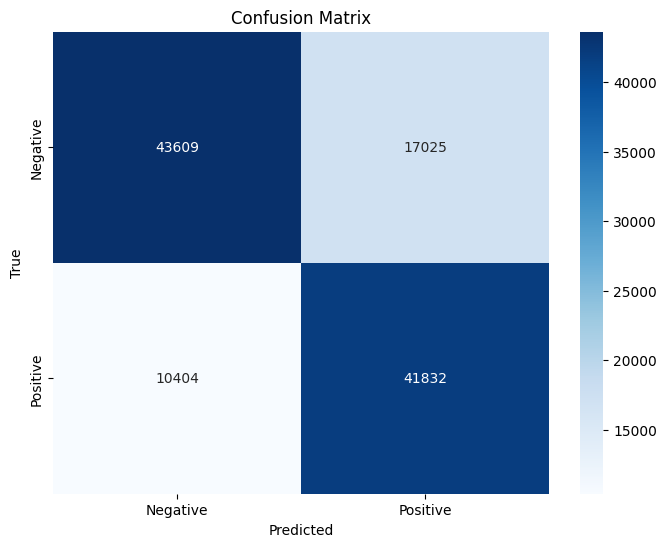

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.72      0.76     60634
           1       0.71      0.80      0.75     52236

    accuracy                           0.76    112870
   macro avg       0.76      0.76      0.76    112870
weighted avg       0.76      0.76      0.76    112870



In [166]:
# 모델을 사용하여 예측 수행
y_pred_rf = model_rf.predict(X_test_rf)
y_true_rf = y_test_rf.values  # Pandas Series를 NumPy 배열로 변환

# Confusion Matrix 생성
conf_matrix_rf = confusion_matrix(y_true_rf, np.round(y_pred_rf))

# 시각화
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_rf, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# 분류 보고서 생성
classification_rep_rf = classification_report(y_true_rf, np.round(y_pred_rf))
print("Classification Report:")
print(classification_rep_rf)

## XgBoosting

In [137]:
# Features와 Target 분리
X_xgb = data00.drop('ticket_cancel', axis=1)  # Features
y_xgb = data00['ticket_cancel']                # Target

# 학습 데이터와 테스트 데이터로 분리
X_train_xgb, X_test_xgb, y_train_xgb, y_test_xgb = train_test_split(X_xgb, y_xgb, test_size=0.2, random_state=42)

# 모델 훈련 (XGBoost 분류기를 사용)
model_xgb = XGBClassifier(random_state=42)
model_xgb.fit(X_train_xgb, y_train_xgb)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='binary:logistic',
              predictor='auto', random_state=42, reg_alpha=0, ...)

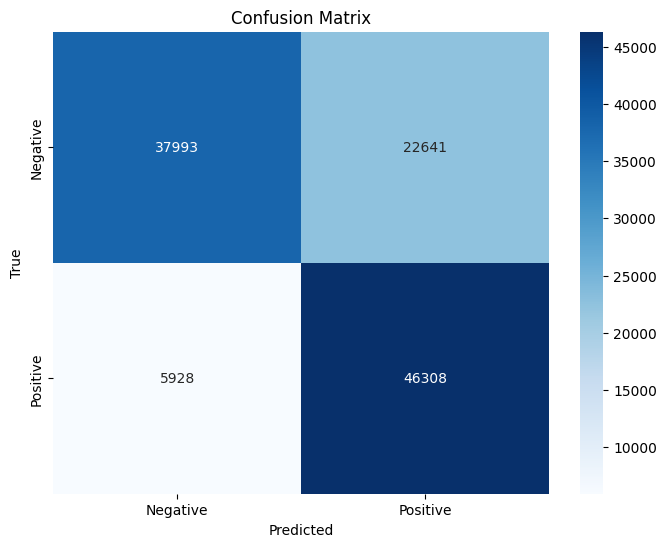

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.63      0.73     60634
           1       0.67      0.89      0.76     52236

    accuracy                           0.75    112870
   macro avg       0.77      0.76      0.75    112870
weighted avg       0.78      0.75      0.74    112870



In [165]:
# 모델을 사용하여 예측 수행
y_pred_xgb = model_xgb.predict(X_test_xgb)
y_true_xgb = y_test_xgb.values  # Pandas Series를 NumPy 배열로 변환

# Confusion Matrix 생성
conf_matrix_xgb = confusion_matrix(y_true_xgb, np.round(y_pred_xgb))

# 시각화
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_xgb, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# 분류 보고서 생성
classification_rep_xgb = classification_report(y_true_xgb, np.round(y_pred_xgb))
print("Classification Report:")
print(classification_rep_xgb)

## GredientBoosting

In [149]:
# 피처와 타깃 변수 설정
X = data00.drop(['ticket_cancel'], axis=1)
y = data00['ticket_cancel']

# 데이터 분할: 학습 데이터셋과 테스트 데이터셋으로 나눕니다.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 모델 생성 및 학습
model_gb_new = GradientBoostingClassifier(random_state=42)
model_gb_new.fit(X_train, y_train)

# 성능 평가: 정확도를 출력합니다.
print("Training Accuracy: ", model_gb_new.score(X_train, y_train))
print("Testing Accuracy: ", model_gb_new.score(X_test, y_test))

Training Accuracy:  0.737672710519671
Testing Accuracy:  0.7354567201204926


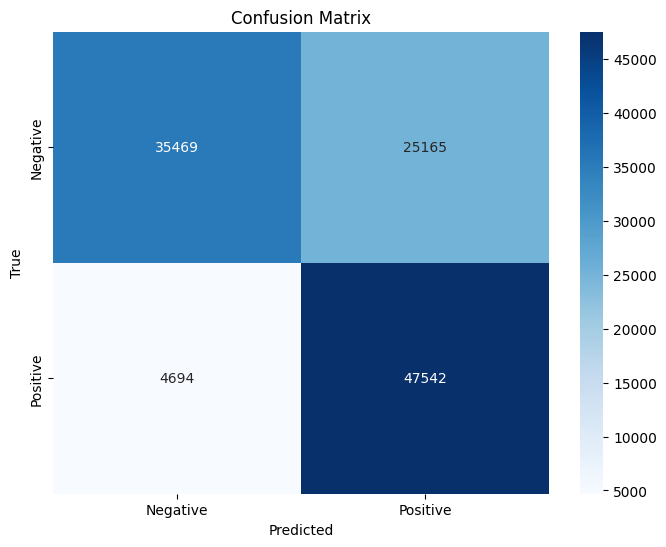

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.58      0.70     60634
           1       0.65      0.91      0.76     52236

    accuracy                           0.74    112870
   macro avg       0.77      0.75      0.73    112870
weighted avg       0.78      0.74      0.73    112870



In [164]:
# 모델을 사용하여 예측 수행
y_pred = model_gb_new.predict(X_test)
y_true = y_test.values  # Pandas Series를 NumPy 배열로 변환

# Confusion Matrix 생성
conf_matrix = confusion_matrix(y_true, np.round(y_pred))

# 시각화
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# 분류 보고서 생성
classification_rep = classification_report(y_true, np.round(y_pred))
print("Classification Report:")
print(classification_rep)

# 가격 조정

In [187]:
datad = data0.copy()
datad['discount_rate'] = ggg_data['discount_rate']

In [157]:
# # 5개로 쪼개 -> 할인율 분포 보기
# # 'discount_rate'에서 0이 아닌 행만 선택합니다.
# datad_nonzero = datad[datad['discount_rate'] != 0]

# # 'discount_rate'을 오름차순으로 정렬합니다.
# datad_sorted = datad_nonzero.sort_values('discount_rate')

# # 전체 행을 5등분합니다. 중복된 bin edges는 무시합니다.
# datad_sorted['quantile'] = pd.qcut(datad_sorted['discount_rate'], 5, duplicates='drop')

# # 박스 플롯을 생성합니다.
# plt.figure(figsize=(10,6))
# sns.boxplot(x='quantile', y='discount_rate', data=datad_sorted)
# plt.xticks(rotation=90)
# plt.title('Distribution of discount rate across quantiles')
# plt.show()

# # 'discount_rate'에서 구간을 나눕니다.
# bins = [0, 0.05, 0.15, 0.3, 0.4, 0.8]
# labels = ['1구간', '2구간', '3구간', '4구간', '5구간']
# datad['quantile'] = pd.cut(datad['discount_rate'], bins=bins, labels=labels, include_lowest=True)

# # 각 구간에 속하는 행의 개수를 출력합니다.
# counts = datad["quantile"].value_counts().sort_index()

# for i in range(len(counts)):
#     print(f"{counts.index[i]} (실제 값: ({bins[i]}, {bins[i+1]})): {counts[counts.index[i]]}개")

1구간 (실제 값: (0, 0.05)): 300170개
2구간 (실제 값: (0.05, 0.15)): 0개
3구간 (실제 값: (0.15, 0.3)): 0개
4구간 (실제 값: (0.3, 0.4)): 0개
5구간 (실제 값: (0.4, 0.8)): 0개


C:\Users\ppq39\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:20: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


(0.049, 0.1]    103800
(0.1, 0.15]      15189
(0.15, 0.2]      42367
(0.2, 0.4]       62330
(0.4, 0.8]       40492
Name: quantile, dtype: int64


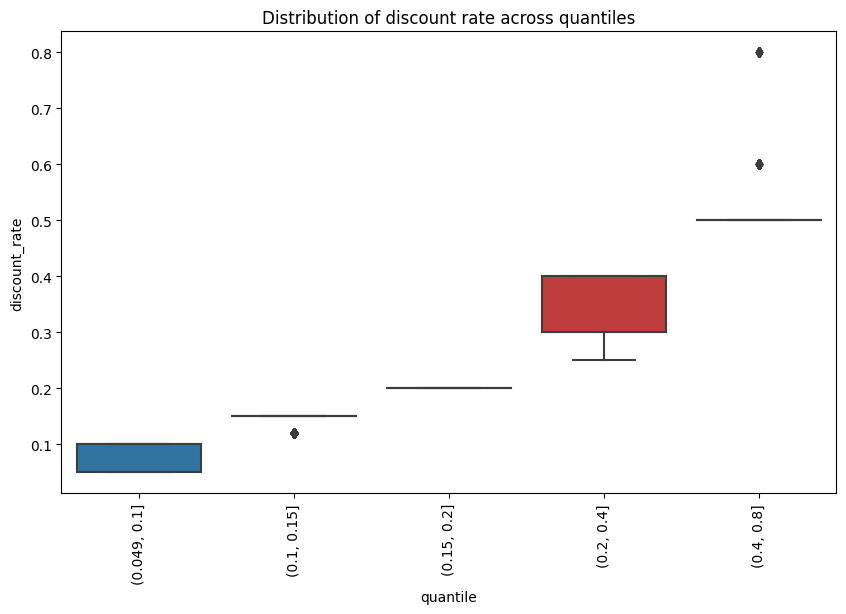

In [188]:
# 'discount_rate'에서 0이 아닌 행만 선택합니다.
datad_nonzero = datad[datad['discount_rate'] != 0]

# 'discount_rate'을 오름차순으로 정렬합니다.
datad_sorted = datad_nonzero.sort_values('discount_rate')

# 전체 행을 5등분합니다. 중복된 bin edges는 무시합니다.
datad_sorted['quantile'] = pd.qcut(datad_sorted['discount_rate'], 5, duplicates='drop')

# 각 구간에 속하는 행의 개수를 출력합니다.
print(datad_sorted['quantile'].value_counts().sort_index())

# 박스 플롯을 생성합니다.
plt.figure(figsize=(10,6))
sns.boxplot(x='quantile', y='discount_rate', data=datad_sorted)
plt.xticks(rotation=90)
plt.title('Distribution of discount rate across quantiles')
plt.show()

In [189]:
# 'discount_rate'에서 구간을 나눕니다.
bins = [0, 0.05, 0.15, 0.3, 0.4, 0.8]
labels = ['1구간', '2구간', '3구간', '4구간', '5구간']
datad['quantile'] = pd.cut(datad['discount_rate'], bins=bins, labels=labels, include_lowest=True)

# 각 구간에 속하는 행의 개수를 출력합니다.
counts = datad["quantile"].value_counts().sort_index()

for i in range(len(counts)):
    print(f"{counts.index[i]} (실제 값: ({bins[i]}, {bins[i+1]})): {counts[counts.index[i]]}개")

1구간 (실제 값: (0, 0.05)): 335983개
2구간 (실제 값: (0.05, 0.15)): 83176개
3구간 (실제 값: (0.15, 0.3)): 81443개
4구간 (실제 값: (0.3, 0.4)): 23254개
5구간 (실제 값: (0.4, 0.8)): 40492개


In [190]:
# 'discount_rate'에서 구간을 나눕니다.
bins = [0, 0.05, 0.15, 0.3, 0.4, 0.8]
labels = ['1', '2', '3', '4', '5']
datad['discount_rate_quantile'] = pd.cut(datad['discount_rate'], bins=bins, labels=labels, include_lowest=True)

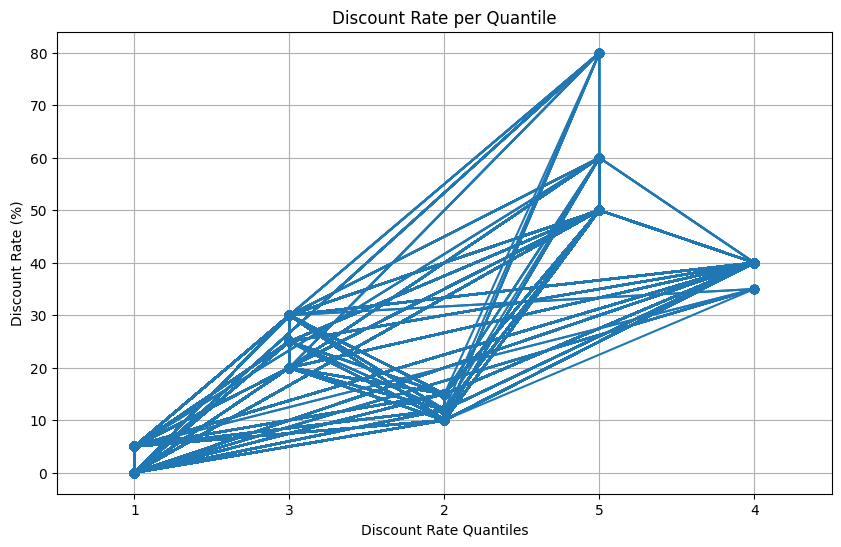

In [191]:
# 'discount_rate'를 퍼센트로 변환합니다.
datad['discount_rate'] = datad['discount_rate'] * 100

# 각 구간별 할인율을 꺾은선 그래프로 표시합니다.
plt.figure(figsize=(10,6))
plt.plot(datad['discount_rate_quantile'], datad['discount_rate'], marker='o')

plt.xlabel('Discount Rate Quantiles')
plt.ylabel('Discount Rate (%)')
plt.title('Discount Rate per Quantile')

# x축의 범위를 설정합니다.
plt.xlim(-0.5, len(datad['discount_rate_quantile'].unique())-0.5)

plt.grid(True)
plt.show()

In [198]:
data_p=datad.copy()
data_p['price'] = data0['price']

In [200]:
# 1. 각 구간별로 데이터를 분리합니다.
quantiles = datad['discount_rate_quantile'].unique()
data_by_quantile = {quantile: data_p[data_p['discount_rate_quantile'] == quantile] for quantile in quantiles}

print(f"Number of rows per quantile: {[len(data) for data in data_by_quantile.values()]}")  # 각 구간별 행의 수 출력

increase_percent = 0.05   # 변경할 비율 설정 (예: 5%)

for quantile, data in data_by_quantile.items():
    print(f"Processing {quantile}...")   # 현재 처리 중인 구간 출력

    # 원본 데이터 복사
    data_copy = data.copy()

    # discount_rate를 일정 퍼센트 증가시킵니다.
    original_discount_rates = data_copy['discount_rate'].copy()   # 원래 할인율 저장
    data_copy['discount_rate'] *= (1 + increase_percent)

    print(f"Discount rate changed by {increase_percent * 100}% : {np.any(original_discount_rates != data_copy['discount_rate'])}")   # 할인율 변경 여부 출력
    
    # 새로운 ticket_cancel 값을 예측합니다.
    X_predictors = data_copy.drop(['ticket_cancel', 'discount_rate_quantile', 'quantile','discount_rate','cluster_labels','reservation_rate'], axis=1)
    new_ticket_cancels = model_gb_new.predict(X_predictors)
    
    # 원래 ticket_cancel 값이 1인데 예측값이 0으로 바뀌는 경우의 price 값을 가져옵니다.
    increased_revenue_scaled = data_copy['price'][(data_copy['ticket_cancel'] == 1) & (new_ticket_cancels == 0)]

    # 이제 스케일링된 가격들을 합산합니다.
    total_increased_revenue_scaled = np.sum(increased_revenue_scaled)

    print(f"Increased revenue for {quantile}: {total_increased_revenue_scaled}")


Number of rows per quantile: [335983, 81443, 83176, 40492, 23254]
Processing 1...
Discount rate changed by 5.0% : True
Increased revenue for 1: 1551282000
Processing 3...
Discount rate changed by 5.0% : True
Increased revenue for 3: 337519000
Processing 2...
Discount rate changed by 5.0% : True
Increased revenue for 2: 655450000
Processing 5...
Discount rate changed by 5.0% : True
Increased revenue for 5: 258083000
Processing 4...
Discount rate changed by 5.0% : True
Increased revenue for 4: 73772000


In [203]:
# 실제 매출값
real=datad.copy()

# 'discount_rate_quantile' 값에 따라 데이터를 그룹화 하고 'ticket_cancel' 열의 값이 1인 행들의 가격('price')을 합산
real_cancelled = real[real['ticket_cancel'] == 1]
sum_price_by_quantile = real_cancelled.groupby('discount_rate_quantile')['price'].sum()

# 결과 출력
print(sum_price_by_quantile)

datad = data0.copy()

discount_rate_quantile
1    14997.514583
2     7868.350000
3     4662.318750
4     1097.108333
5     1437.685417
Name: price, dtype: float64


In [204]:
#데이터프레임 만들기

# 데이터 정의
data27 = {
    'quantile': [1, 2, 3, 4, 5],
    'real': [1394644000, 389892000, 368988000, 87354000, 188410000],
    'increased': [1246283000,93821000,154892000,40400000 ,69919000]
}

# 데이터프레임 생성
f_df = pd.DataFrame(data27)

f_df['sum']=f_df['real'] + f_df['increased']
# 출력
print(f_df)

   quantile        real   increased         sum
0         1  1394644000  1246283000  2640927000
1         2   389892000    93821000   483713000
2         3   368988000   154892000   523880000
3         4    87354000    40400000   127754000
4         5   188410000    69919000   258329000


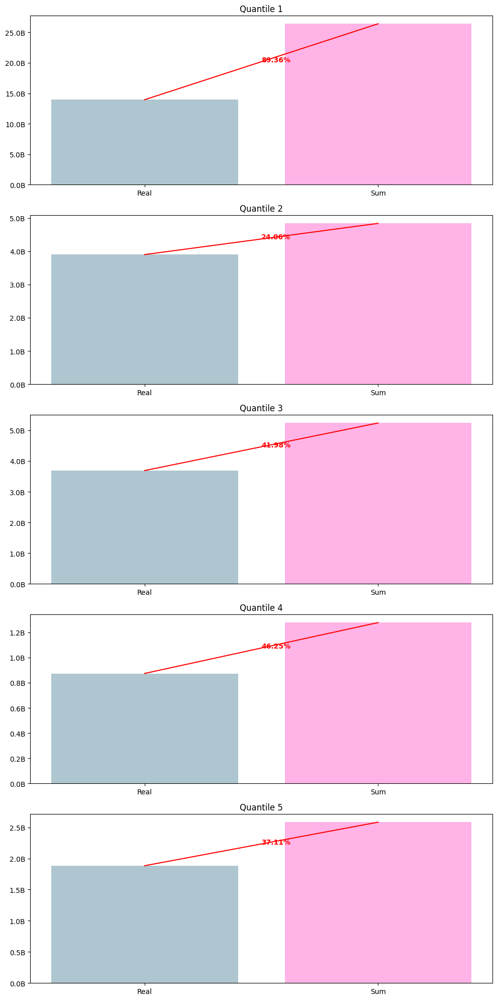

In [205]:
# 함수 정의: 소수점 두 자리까지 표시
def billion_formatter(x, pos):
    return f'{x:.1f}B'

fig, axs = plt.subplots(5, figsize=(10,20))

pastel_blue = '#aec6cf'  # 파스텔 블루
pastel_pink = '#ffb3e6'  # 파스텔 핑크

for i in range(5):
    real_value = f_df['real'][i] / 1e8   # 값을 억 단위로 변환
    sum_value = f_df['sum'][i] / 1e8     # 값을 억 단위로 변환

    axs[i].bar(['Real'], [real_value], color=pastel_blue)
    axs[i].bar(['Sum'], [sum_value], color=pastel_pink)

    axs[i].set_title(f'Quantile {f_df["quantile"][i]}')

    # y축 값 포맷 설정
    formatter = FuncFormatter(billion_formatter)
    axs[i].yaxis.set_major_formatter(formatter)

    # 상승률 계산 및 표시하기 (선 그리기 및 텍스트 추가)
    increase_rate = (sum_value - real_value) / real_value * 100   # 증가율 계산 (%)
    axs[i].plot([0, 1], [real_value, sum_value], color='red')
    axs[i].text(0.5 , (real_value + sum_value) / 2 , f'{increase_rate:.2f}%', color='red', fontweight='bold')

plt.tight_layout()
plt.show()